<a href="https://colab.research.google.com/github/nehansa2003/Weather-Forecasting-Project/blob/main/Analysis2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
import pandas as pd
import os
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import display
import seaborn as sns

In [2]:
drive.mount("/content/drive")

Mounted at /content/drive


In [3]:
dataset='/content/drive/MyDrive/Capstone_Datasets/weather_data_processed_2020_2025.parquet'

In [4]:
# Load Parquet dataset
weather_df = pd.read_parquet(
    dataset,
    engine="pyarrow"
)

print("Dataset loaded successfully!")

print("\nShape:")
print(weather_df.shape)

print("\nColumns:")
print(weather_df.columns.tolist())

print("\nDate range:")
print(weather_df["datetime"].min())
print("to")
print(weather_df["datetime"].max())

print("\nDistricts:")
print(weather_df["district"].unique())

print("\nGeographical points:")
print(weather_df["global_pointid"].nunique())

display(weather_df.head())

Dataset loaded successfully!

Shape:
(5629056, 34)

Columns:
['district', 'pointid', 'global_pointid', 'latitude', 'longitude', 'elevation_m', 'datetime', 'date', 'day', 'month', 'year', 'time', 'season', 'hour', 'day_of_week', 'day_of_year', 'is_weekend', 'hour_sin', 'hour_cos', 'month_sin', 'month_cos', 'temperature_c', 'feelslike_c', 'humidity_pct', 'dewpoint_c', 'pressure_hpa', 'windspeed_kmh', 'winddirection_deg', 'winddirection_compass', 'windgust_kmh', 'rainfall_mm', 'cloudcover_pct', 'solarradiation_wm2', 'sunshineduration_s']

Date range:
2020-01-01 00:00:00
to
2025-12-31 23:00:00

Districts:
['Colombo' 'Galle' 'Gampaha' 'Jaffna' 'Kandy']

Geographical points:
107


,district,pointid,global_pointid,latitude,longitude,elevation_m,datetime,date,day,month,...,dewpoint_c,pressure_hpa,windspeed_kmh,winddirection_deg,winddirection_compass,windgust_kmh,rainfall_mm,cloudcover_pct,solarradiation_wm2,sunshineduration_s
0,Colombo,1,COL_001,6.85991,79.79351,0.0,2020-01-01 00:00:00,2020-01-01,1,1,...,24.0,1012.2,9.0,157,SSE,22.0,0.1,43,0.0,0.0
1,Colombo,1,COL_001,6.85991,79.79351,0.0,2020-01-01 01:00:00,2020-01-01,1,1,...,23.9,1011.7,5.5,148,SSE,15.8,0.0,50,0.0,0.0
2,Colombo,1,COL_001,6.85991,79.79351,0.0,2020-01-01 02:00:00,2020-01-01,1,1,...,24.0,1011.1,4.3,156,SSE,9.7,0.1,78,0.0,0.0
3,Colombo,1,COL_001,6.85991,79.79351,0.0,2020-01-01 03:00:00,2020-01-01,1,1,...,23.9,1010.4,3.9,146,SE,8.6,0.1,92,0.0,0.0
4,Colombo,1,COL_001,6.85991,79.79351,0.0,2020-01-01 04:00:00,2020-01-01,1,1,...,23.8,1010.5,3.6,96,E,7.2,0.0,90,0.0,0.0


Weather variable distributions

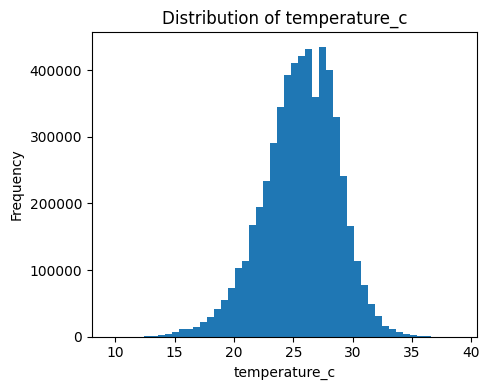

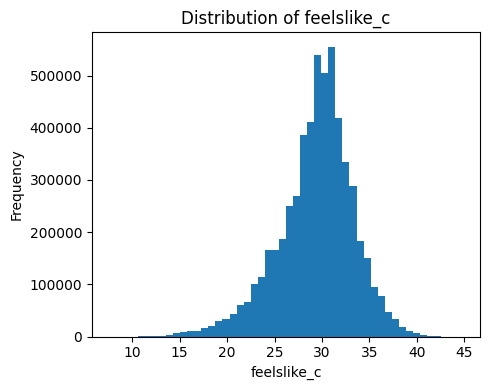

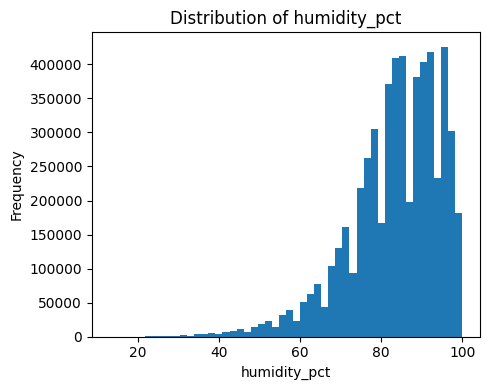

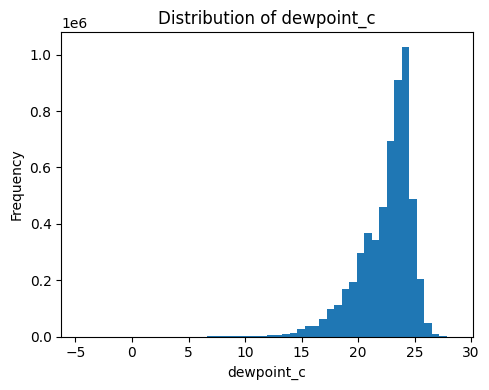

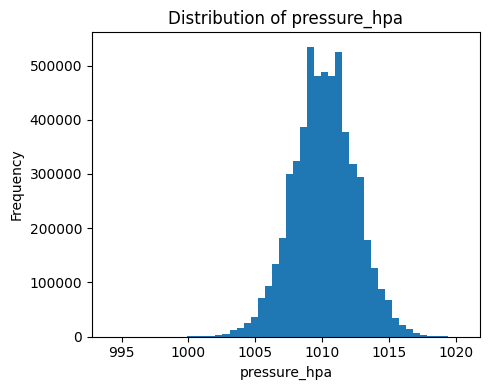

...

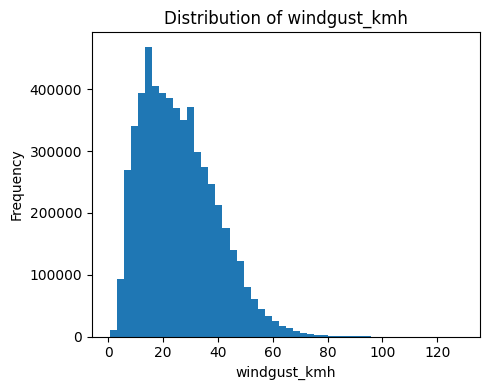

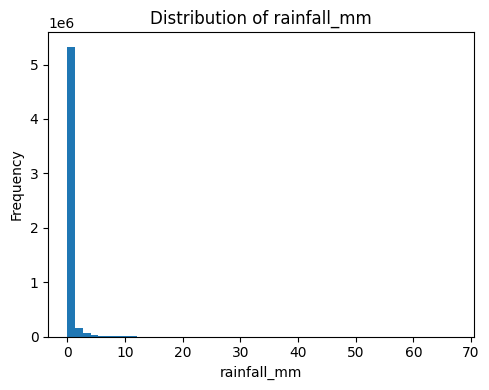

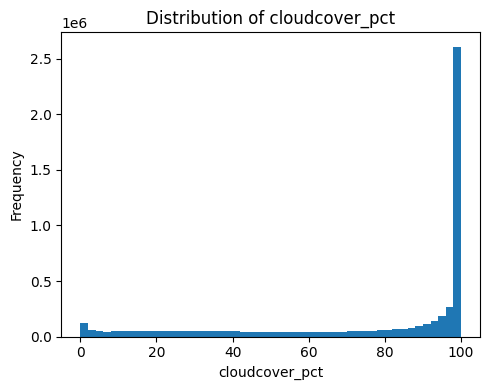

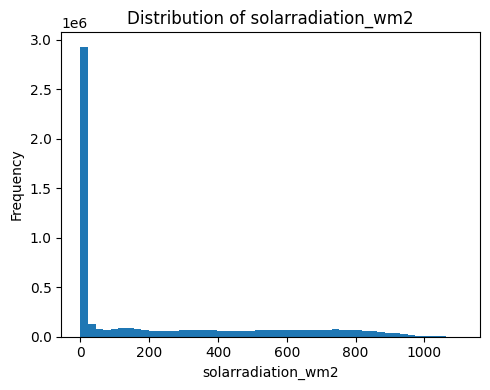

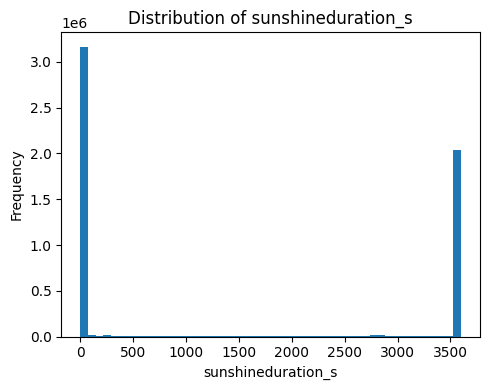

In [ ]:
weather_variables = [
    "temperature_c",
    "feelslike_c",
    "humidity_pct",
    "dewpoint_c",
    "pressure_hpa",
    "windspeed_kmh",
    "windgust_kmh",
    "rainfall_mm",
    "cloudcover_pct",
    "solarradiation_wm2",
    "sunshineduration_s"
]

for column in weather_variables:

    if column not in weather_df.columns:
        continue

    plt.figure(figsize=(5, 4))

    plt.hist(
        weather_df[column].dropna(),
        bins=50
    )

    plt.title(
        f"Distribution of {column}"
    )

    plt.xlabel(column)
    plt.ylabel("Frequency")

    plt.tight_layout()
    plt.show()

District-Wise Analysis

In [ ]:
# ================================================================
# SIX-YEAR DISTRICT-WISE AVERAGE
# ================================================================

weather_variables = [
    "temperature_c",
    "humidity_pct",
    "pressure_hpa",
    "windspeed_kmh",
    "windgust_kmh",
    "rainfall_mm",
    "cloudcover_pct",
    "solarradiation_wm2",
    "sunshineduration_s"
]

# Keep only variables that actually exist in the dataset
available_variables = [
    col for col in weather_variables
    if col in weather_df.columns
]

district_average = (
    weather_df
    .groupby("district")[available_variables]
    .mean()
    .reset_index()
)

print("Six-Year District-Wise Average")
display(district_average.round(3))

Six-Year District-Wise Average


,district,temperature_c,humidity_pct,pressure_hpa,windspeed_kmh,windgust_kmh,rainfall_mm,cloudcover_pct,solarradiation_wm2,sunshineduration_s
0,Colombo,26.705,83.900,1009.734,11.164,23.482,0.340,76.691,217.037,1409.108
1,Galle,26.431,84.906,1009.868,12.122,24.420,0.336,77.331,219.798,1448.646
2,Gampaha,26.347,84.407,1009.780,9.389,21.666,0.358,77.246,212.809,1382.675
3,Jaffna,27.895,78.654,1008.965,17.254,32.318,0.162,70.484,232.320,1531.600
4,Kandy,23.020,84.155,1011.348,9.404,26.356,0.271,78.489,217.365,1410.871


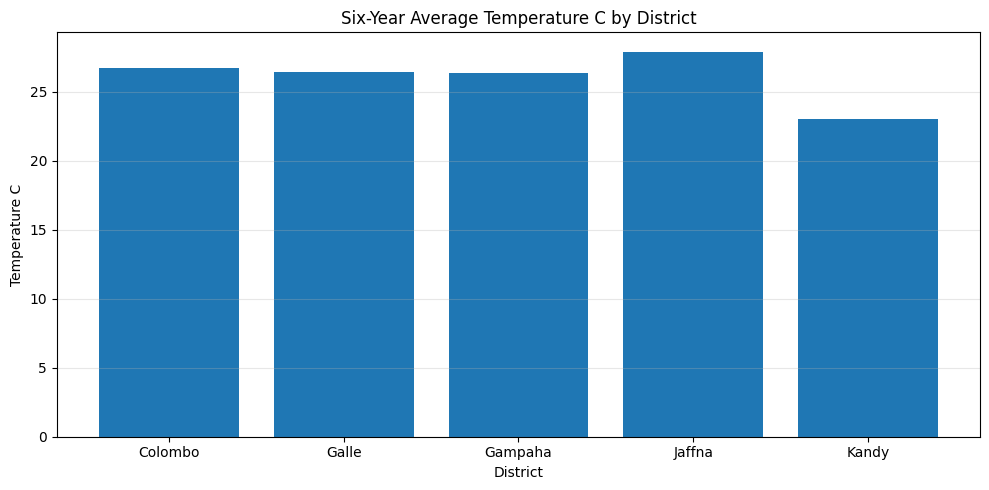

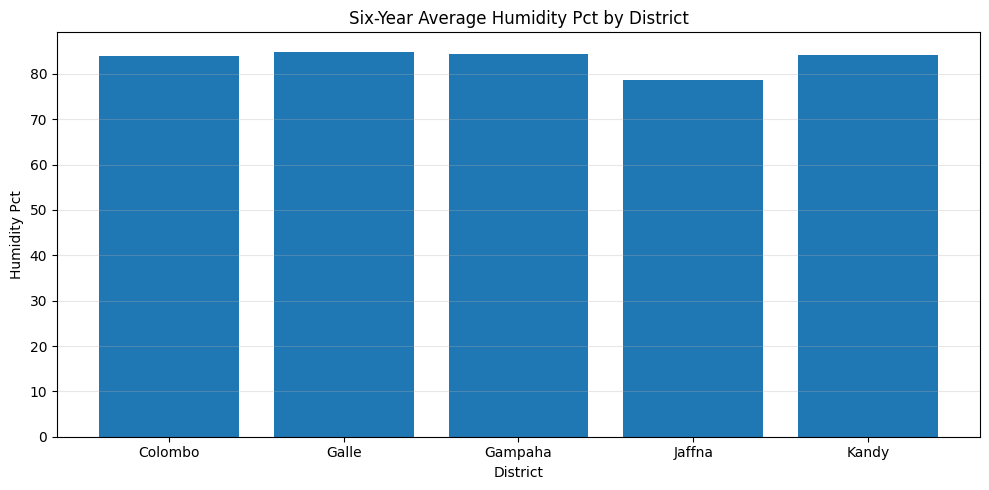

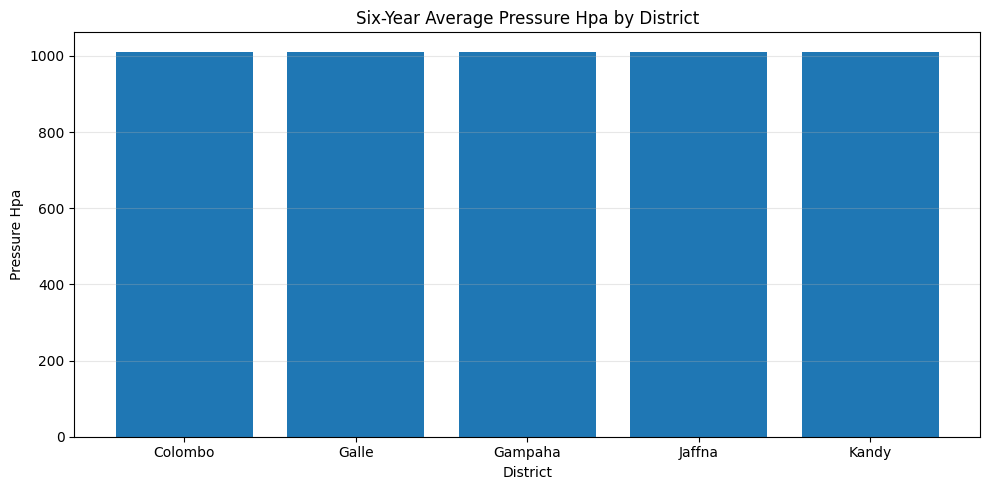

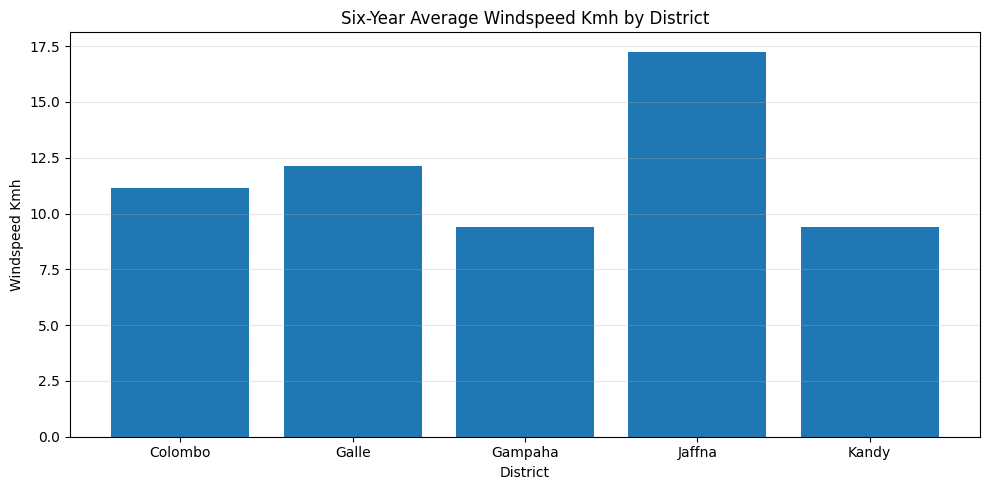

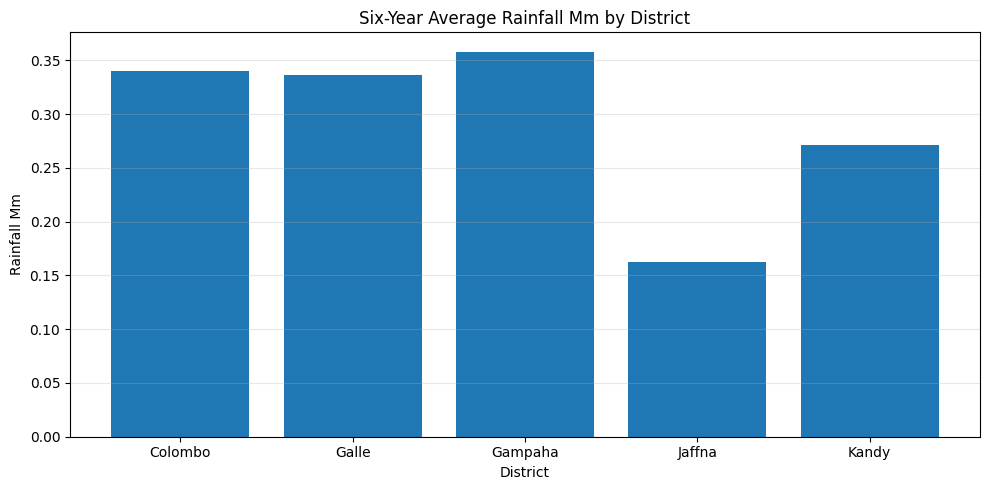

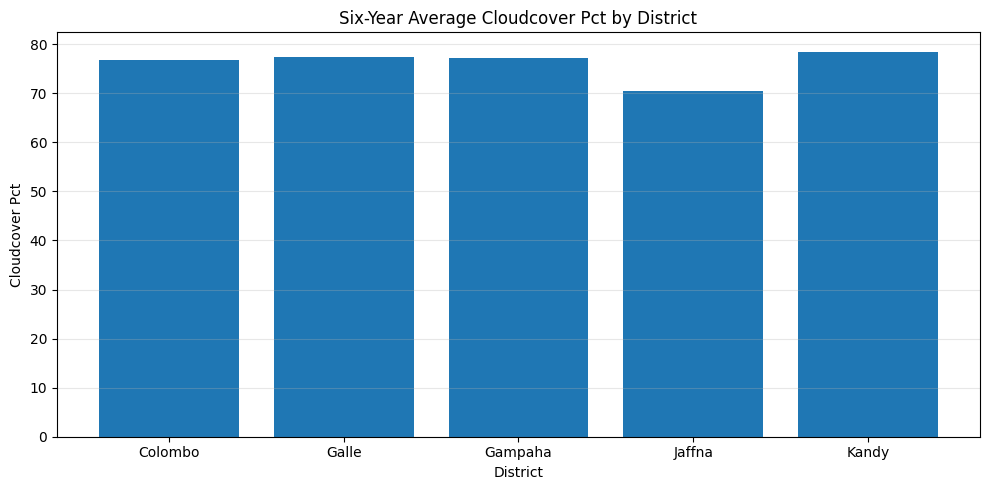

In [ ]:
# ================================================================
# SIX-YEAR DISTRICT-WISE AVERAGE VISUALIZATION
# ================================================================

plot_variables = [
    "temperature_c",
    "humidity_pct",
    "pressure_hpa",
    "windspeed_kmh",
    "rainfall_mm",
    "cloudcover_pct"
]

plot_variables = [
    col for col in plot_variables
    if col in district_average.columns
]

for variable in plot_variables:

    plt.figure(figsize=(10, 5))

    plt.bar(
        district_average["district"],
        district_average[variable]
    )

    plt.title(
        f"Six-Year Average {variable.replace('_', ' ').title()} by District"
    )

    plt.xlabel("District")
    plt.ylabel(variable.replace("_", " ").title())

    plt.grid(
        axis="y",
        alpha=0.3
    )

    plt.tight_layout()
    plt.show()

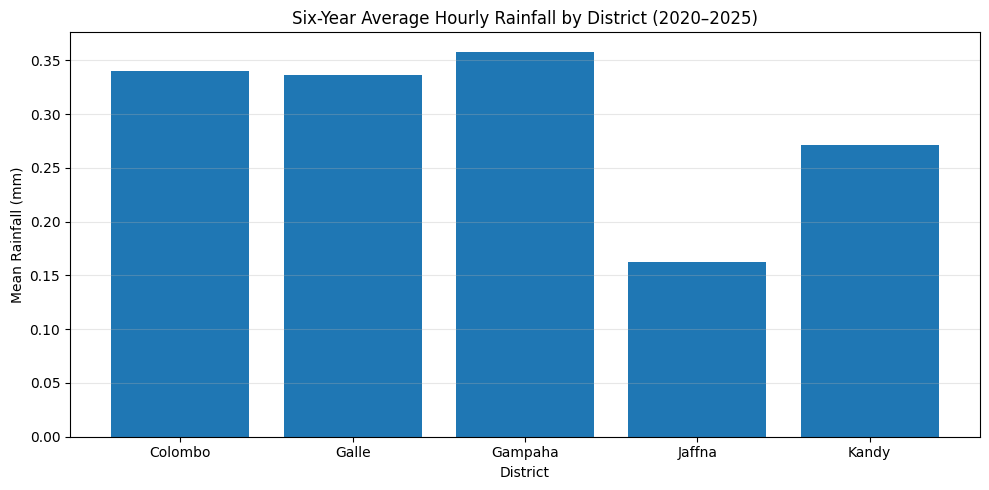

In [ ]:
# ================================================================
# SIX-YEAR AVERAGE RAINFALL BY DISTRICT
# ================================================================

rainfall_average = (
    weather_df
    .groupby("district")["rainfall_mm"]
    .mean()
    .reset_index()
)

plt.figure(figsize=(10, 5))

plt.bar(
    rainfall_average["district"],
    rainfall_average["rainfall_mm"]
)

plt.title(
    "Six-Year Average Hourly Rainfall by District (2020–2025)"
)

plt.xlabel("District")
plt.ylabel("Mean Rainfall (mm)")

plt.grid(
    axis="y",
    alpha=0.3
)

plt.tight_layout()
plt.show()

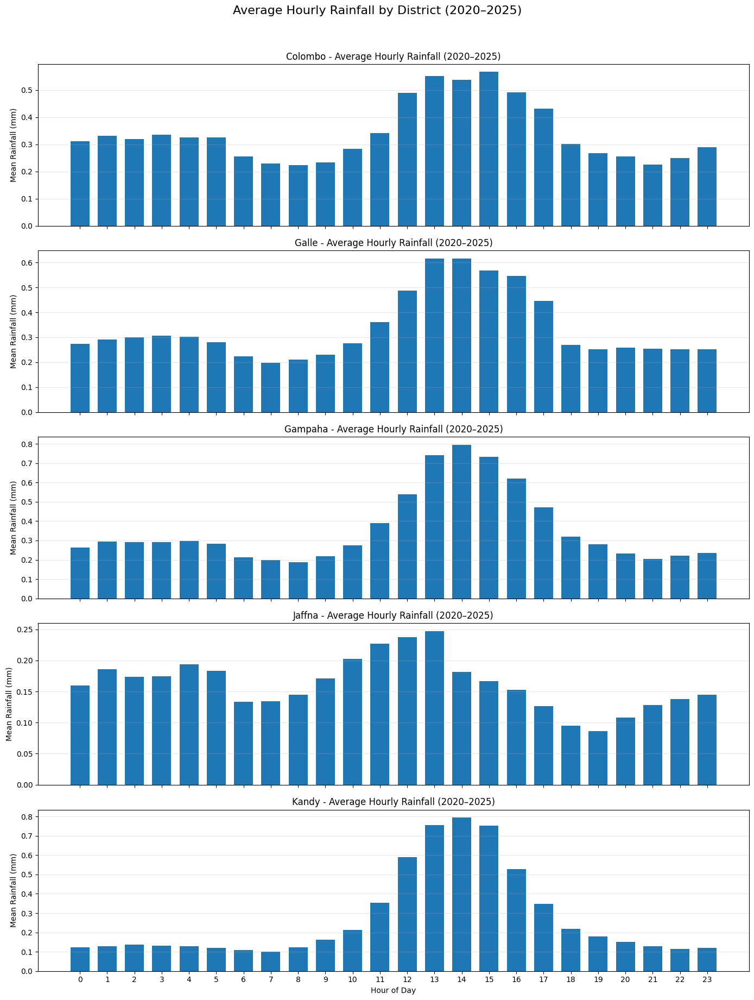

In [ ]:
# ================================================================
# AVERAGE HOURLY RAINFALL — DISTRICT-WISE
# ================================================================

hourly_rainfall_district = (
    weather_df
    .groupby(["district", "hour"])["rainfall_mm"]
    .mean()
    .reset_index()
)

# Get districts
districts = sorted(
    weather_df["district"].unique()
)


fig, axes = plt.subplots(
    nrows=len(districts),
    ncols=1,
    figsize=(14, 18),
    sharex=True
)

if len(districts) == 1:
    axes = [axes]

for ax, district in zip(axes, districts):

    district_data = hourly_rainfall_district[
        hourly_rainfall_district["district"] == district
    ]

    ax.bar(
        district_data["hour"],
        district_data["rainfall_mm"],
        width=0.7
    )

    ax.set_title(
        f"{district} - Average Hourly Rainfall (2020–2025)"
    )

    ax.set_ylabel("Mean Rainfall (mm)")

    ax.set_xticks(range(24))

    ax.grid(
        axis="y",
        alpha=0.3
    )

axes[-1].set_xlabel("Hour of Day")

plt.suptitle(
    "Average Hourly Rainfall by District (2020–2025)",
    fontsize=16,
    y=1.02
)

plt.tight_layout()
plt.show()

Hourly temperature , "temperature_c",
    "humidity_pct",
    "pressure_hpa",
    "windspeed_kmh",
    "windgust_kmh",
    "cloudcover_pct",
    "solarradiation_wm2",

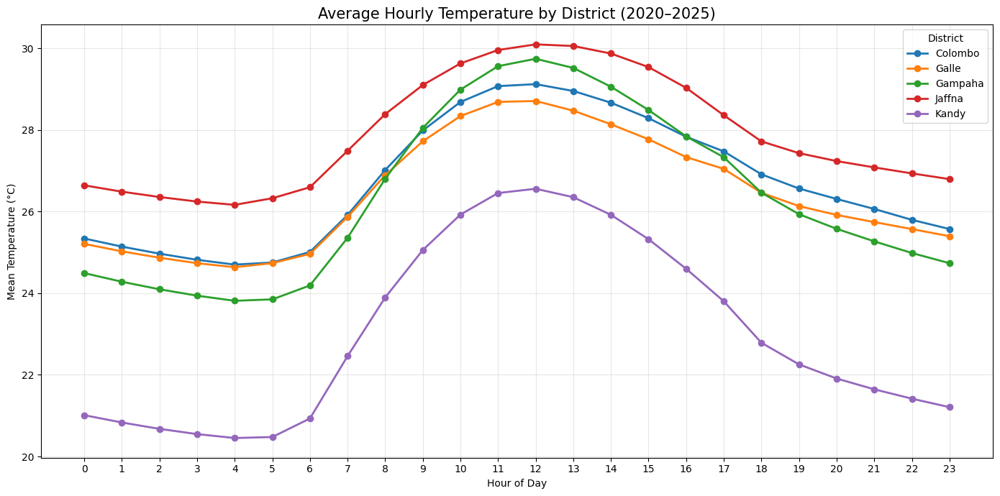

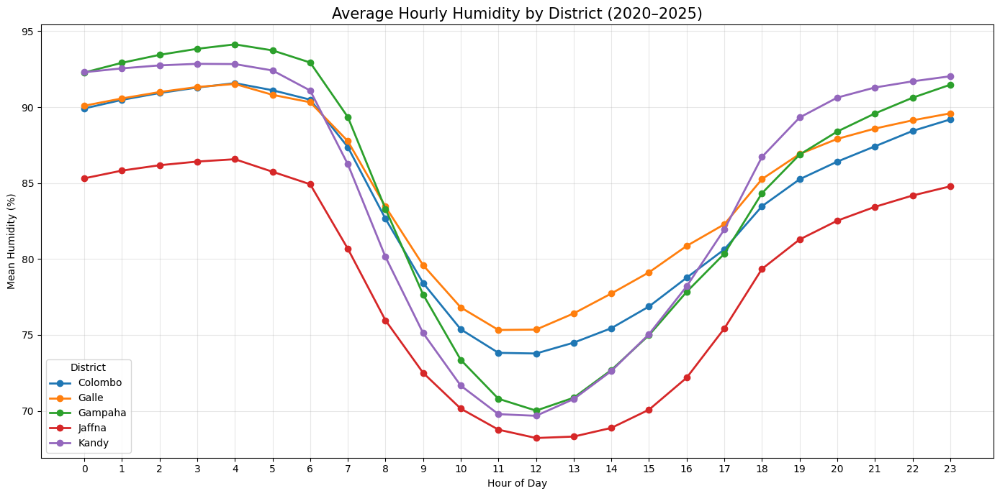

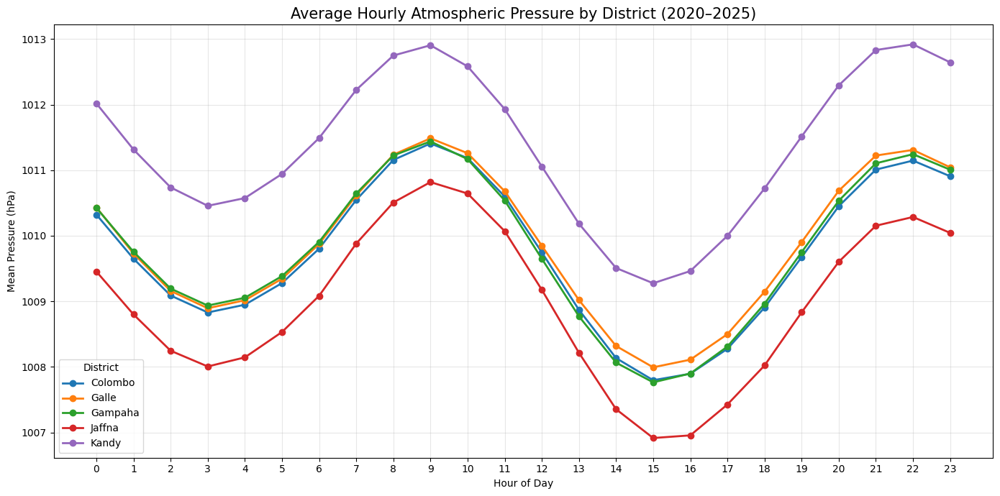

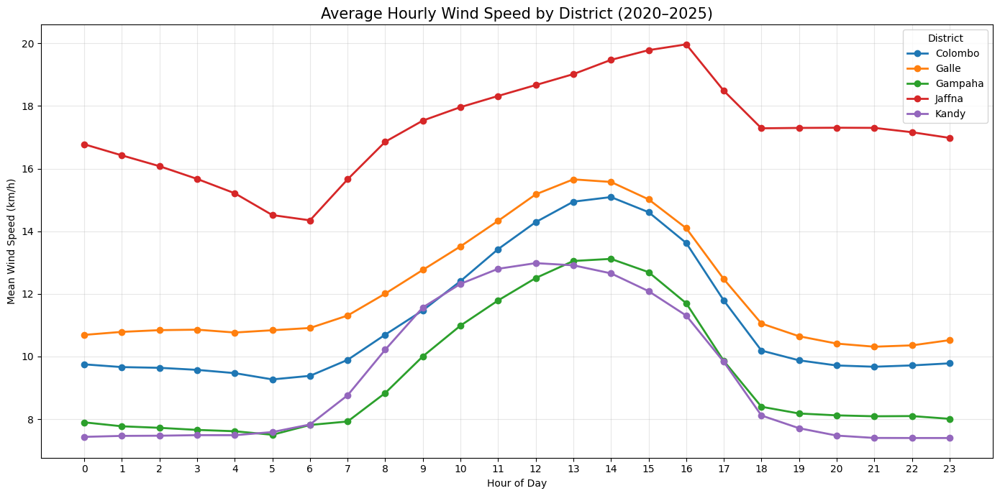

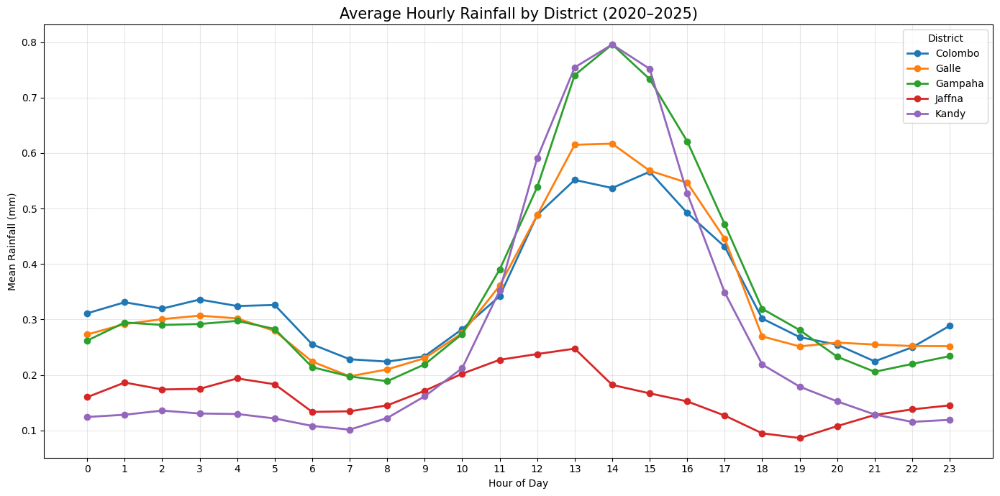

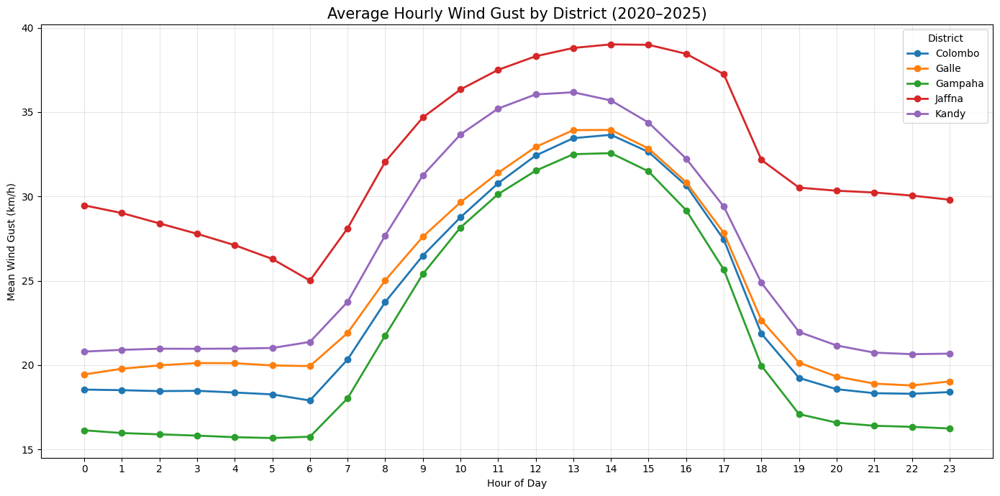

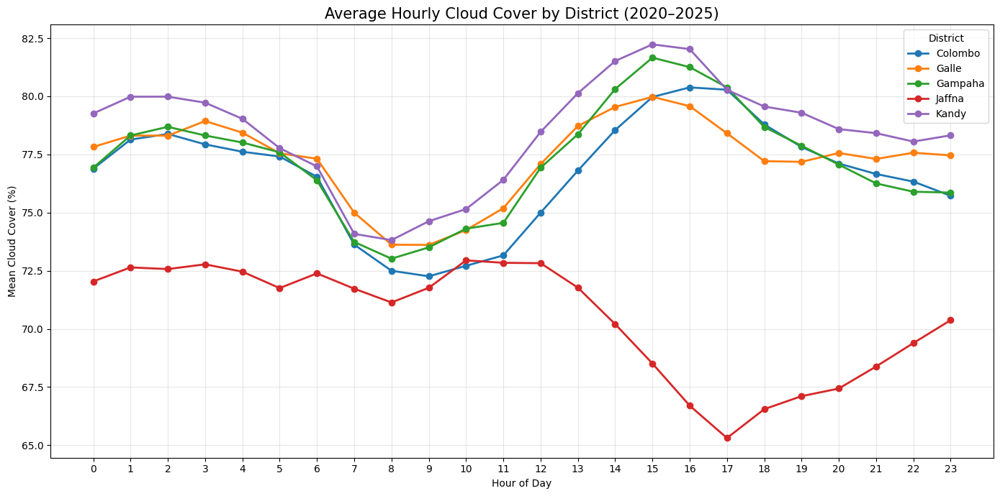

In [ ]:
# ================================================================
# AVERAGE HOURLY ANALYSIS — MAJOR WEATHER VARIABLES
# DISTRICT-WISE LINE CHARTS
# ================================================================

# Major variables to analyze
hourly_variables = [
    "temperature_c",
    "humidity_pct",
    "pressure_hpa",
    "windspeed_kmh",
    "rainfall_mm",
    "windgust_kmh",
    "cloudcover_pct"
]

# Variable names and Y-axis labels
variable_labels = {
    "temperature_c": (
        "Temperature",
        "Mean Temperature (°C)"
    ),
    "humidity_pct": (
        "Humidity",
        "Mean Humidity (%)"
    ),
    "pressure_hpa": (
        "Atmospheric Pressure",
        "Mean Pressure (hPa)"
    ),
    "windspeed_kmh": (
        "Wind Speed",
        "Mean Wind Speed (km/h)"
    ),
    "rainfall_mm": (
        "Rainfall",
        "Mean Rainfall (mm)"
    ),
    "windgust_kmh": (
        "Wind Gust",
        "Mean Wind Gust (km/h)"
    ),
    "cloudcover_pct": (
        "Cloud Cover",
        "Mean Cloud Cover (%)"
    )
}

# Get districts
districts = sorted(
    weather_df["district"].dropna().unique()
)

# ================================================================
# LOOP THROUGH EACH WEATHER VARIABLE
# ================================================================

for variable in hourly_variables:

    # Check whether variable exists
    if variable not in weather_df.columns:
        continue

    # ------------------------------------------------------------
    # Calculate average value for each hour and district
    # ------------------------------------------------------------

    hourly_data = (
        weather_df
        .groupby(["district", "hour"])[variable]
        .mean()
        .reset_index()
    )

    # ------------------------------------------------------------
    # Get variable name and Y-axis label
    # ------------------------------------------------------------

    variable_name, y_label = variable_labels[variable]

    # ------------------------------------------------------------
    # Create figure
    # ------------------------------------------------------------

    plt.figure(figsize=(14, 7))

    # ------------------------------------------------------------
    # Plot each district
    # ------------------------------------------------------------

    for district in districts:

        district_data = hourly_data[
            hourly_data["district"] == district
        ]

        plt.plot(
            district_data["hour"],
            district_data[variable],
            marker="o",
            linewidth=2,
            label=district
        )

    # ------------------------------------------------------------
    # Formatting
    # ------------------------------------------------------------

    plt.title(
        f"Average Hourly {variable_name} by District (2020–2025)",
        fontsize=15
    )

    plt.xlabel("Hour of Day")
    plt.ylabel(y_label)

    plt.xticks(range(24))

    plt.grid(
        alpha=0.3
    )

    # District legend
    plt.legend(
        title="District"
    )

    plt.tight_layout()

    plt.show()

Year-wise analysis

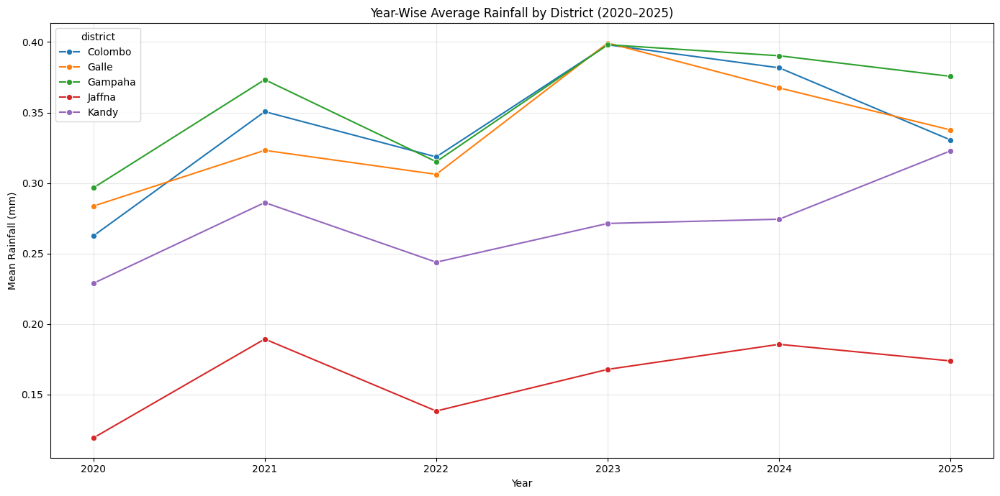

In [ ]:
# ================================================================
# YEAR-WISE AVERAGE RAINFALL BY DISTRICT
# ================================================================

yearly_rainfall = (
    weather_df
    .groupby(["district", "year"])["rainfall_mm"]
    .mean()
    .reset_index()
)

plt.figure(figsize=(14, 7))

sns.lineplot(
    data=yearly_rainfall,
    x="year",
    y="rainfall_mm",
    hue="district",
    marker="o"
)

plt.title(
    "Year-Wise Average Rainfall by District (2020–2025)"
)

plt.xlabel("Year")
plt.ylabel("Mean Rainfall (mm)")

plt.xticks(sorted(weather_df["year"].unique()))

plt.grid(
    alpha=0.3
)

plt.tight_layout()
plt.show()

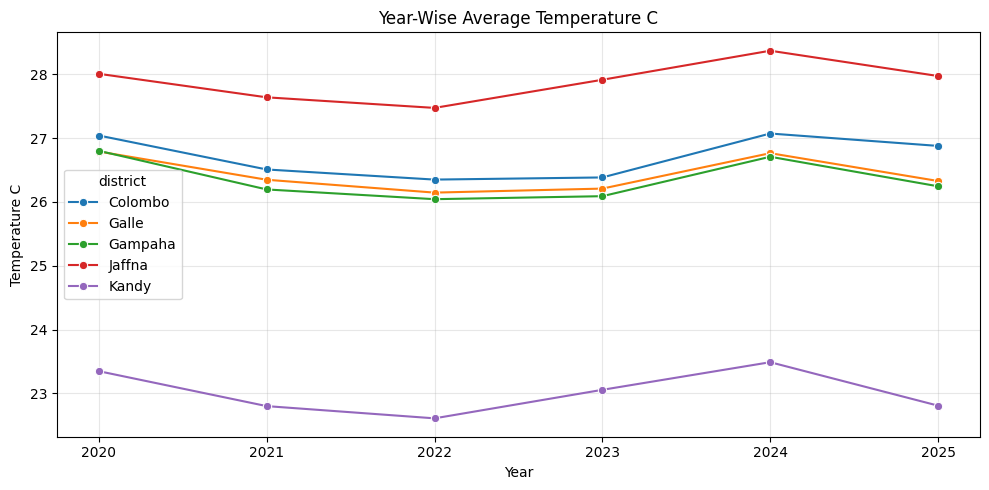

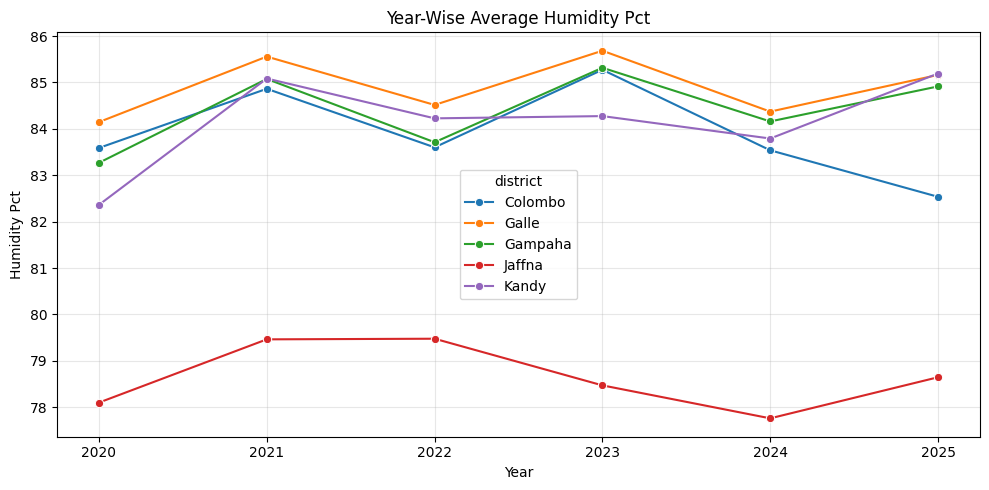

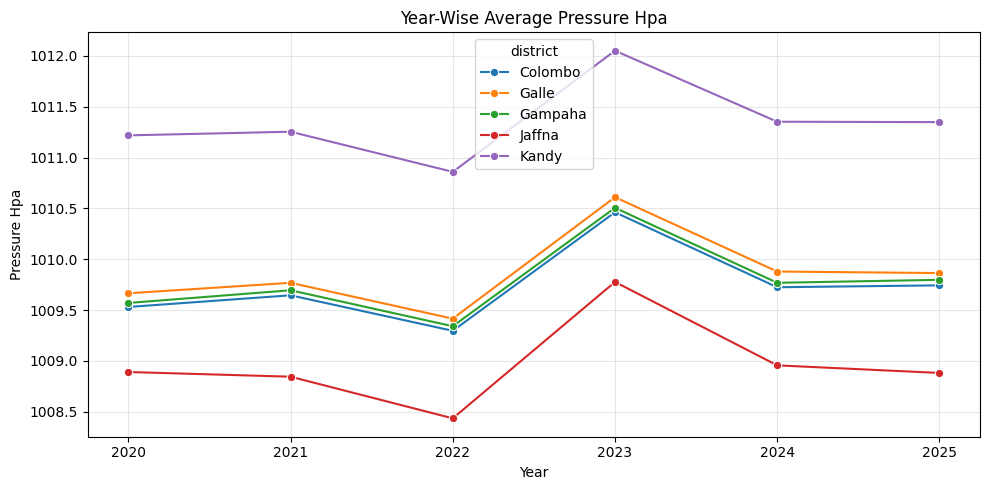

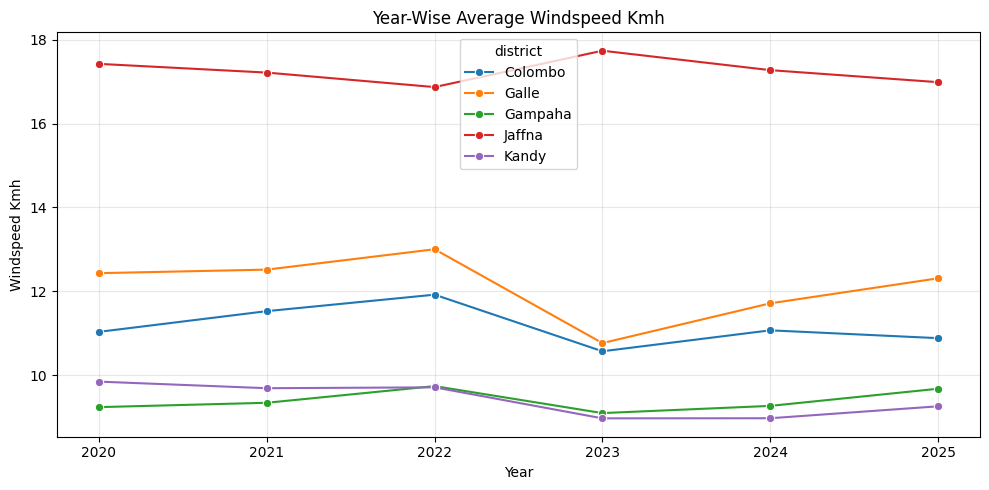

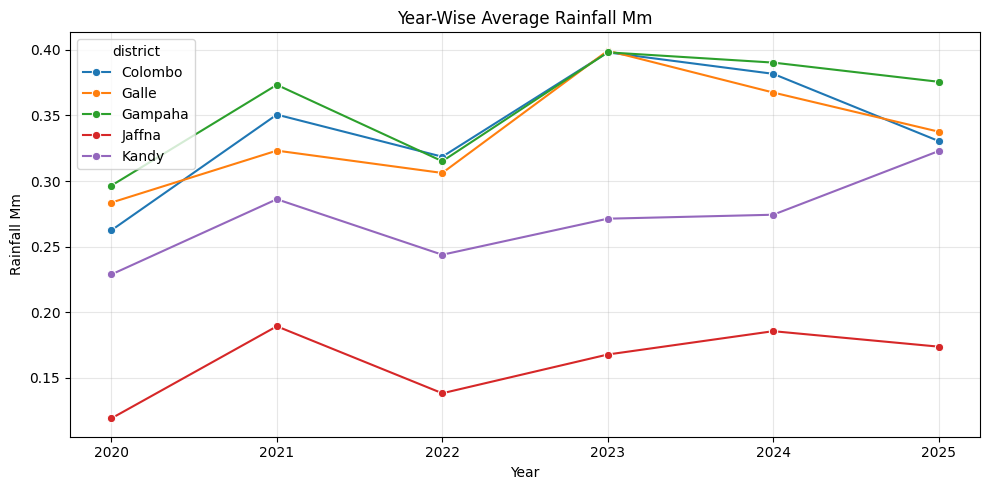

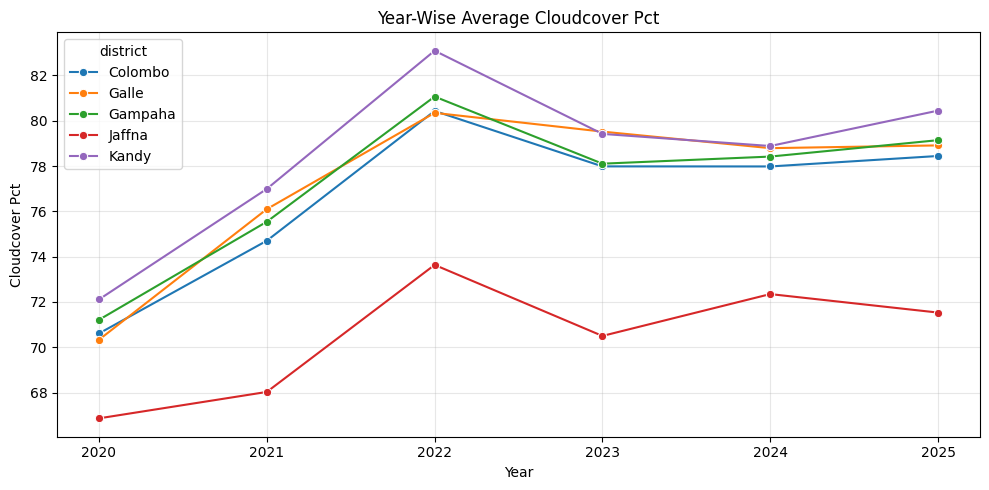

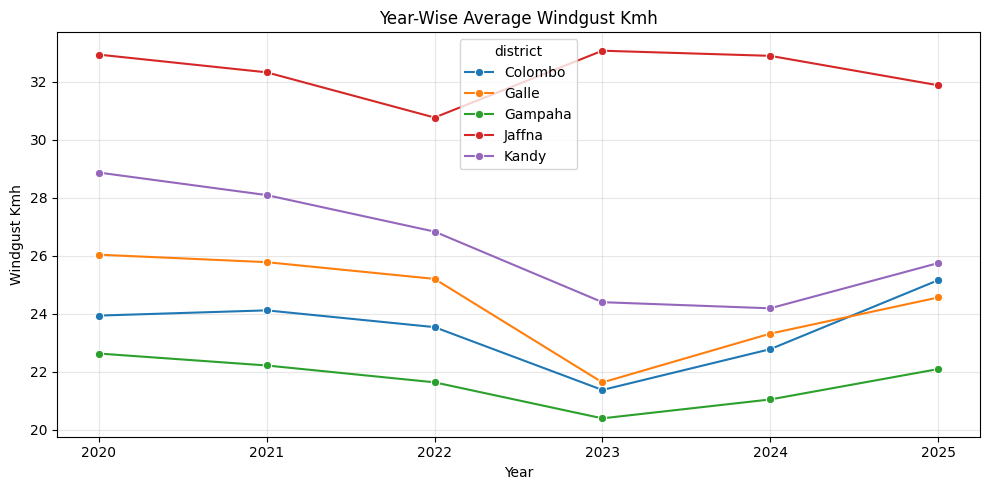

In [ ]:
# ================================================================
# YEAR-WISE ANALYSIS OF MAJOR WEATHER VARIABLES
# ================================================================

yearly_variables = [
    "temperature_c",
    "humidity_pct",
    "pressure_hpa",
    "windspeed_kmh",
    "rainfall_mm",
    "cloudcover_pct",
    "windgust_kmh"
]

for variable in yearly_variables:

    if variable not in weather_df.columns:
        continue

    yearly_data = (
        weather_df
        .groupby(["district", "year"])[variable]
        .mean()
        .reset_index()
    )

    plt.figure(figsize=(10, 5))

    sns.lineplot(
        data=yearly_data,
        x="year",
        y=variable,
        hue="district",
        marker="o"
    )

    plt.title(
        f"Year-Wise Average {variable.replace('_', ' ').title()}"
    )

    plt.xlabel("Year")
    plt.ylabel(variable.replace("_", " ").title())

    plt.grid(alpha=0.3)

    plt.tight_layout()
    plt.show()

In [ ]:
# ================================================================
# CHECK SEASON VALUES
# ================================================================

print(weather_df["season"].value_counts(dropna=False))

season
Southwest_Monsoon      2357424
Northeast_Monsoon      1391856
First_Intermonsoon      939888
Second_Intermonsoon     939888
Name: count, dtype: int64


In [ ]:
# ================================================================
# SEASONAL AVERAGE RAINFALL BY DISTRICT
# ================================================================

seasonal_rainfall = (
    weather_df
    .groupby(["district", "season"])["rainfall_mm"]
    .mean()
    .reset_index()
)

display(
    seasonal_rainfall.round(3)
)

,district,season,rainfall_mm
0,Colombo,First_Intermonsoon,0.191
1,Colombo,Northeast_Monsoon,0.170
2,Colombo,Second_Intermonsoon,0.535
3,Colombo,Southwest_Monsoon,0.422
4,Galle,First_Intermonsoon,0.218
5,Galle,Northeast_Monsoon,0.223
6,Galle,Second_Intermonsoon,0.500
7,Galle,Southwest_Monsoon,0.385
8,Gampaha,First_Intermonsoon,0.228
9,Gampaha,Northeast_Monsoon,0.178


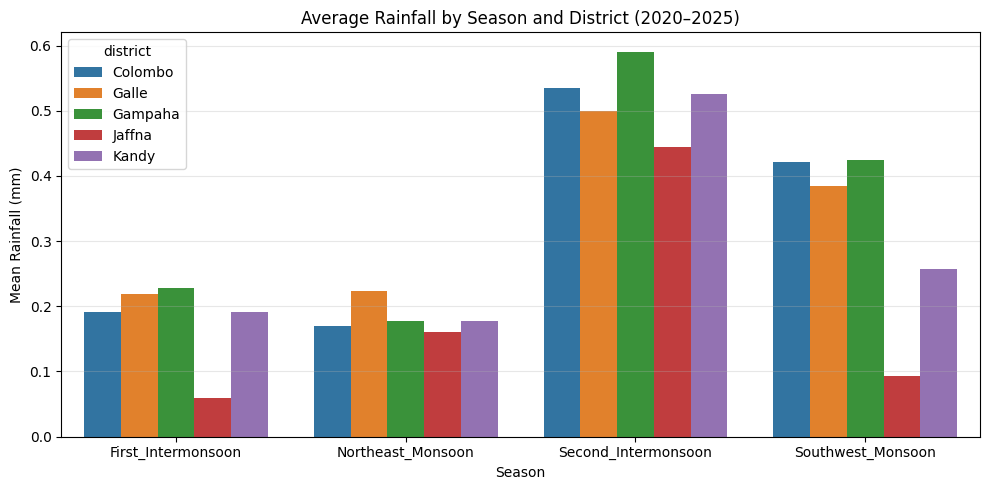

In [ ]:
# ================================================================
# SEASONAL RAINFALL VISUALIZATION
# ================================================================

plt.figure(figsize=(10, 5))

sns.barplot(
    data=seasonal_rainfall,
    x="season",
    y="rainfall_mm",
    hue="district"
)

plt.title(
    "Average Rainfall by Season and District (2020–2025)"
)

plt.xlabel("Season")
plt.ylabel("Mean Rainfall (mm)")

plt.grid(
    axis="y",
    alpha=0.3
)

plt.tight_layout()
plt.show()

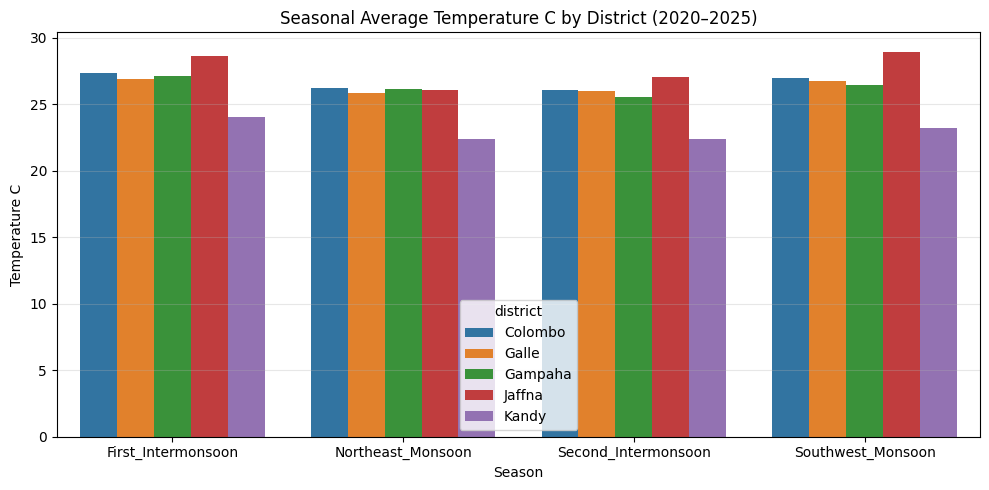

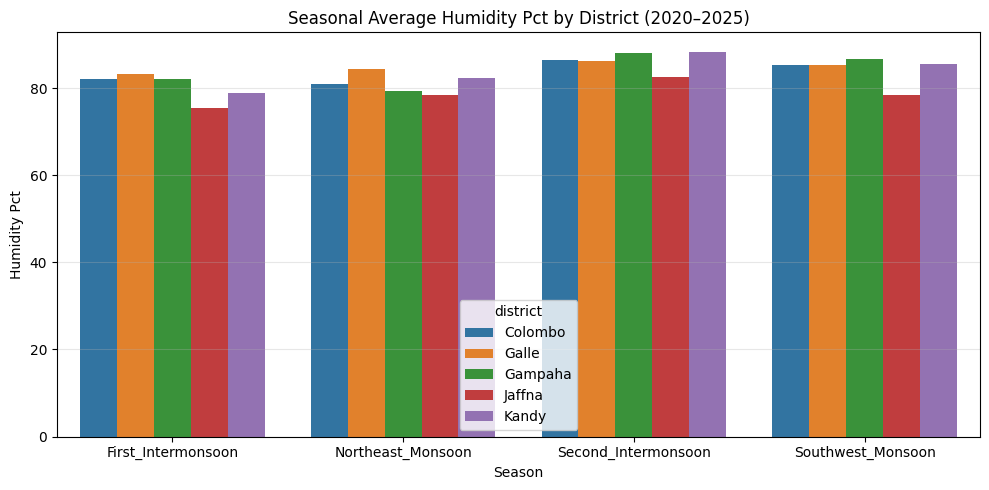

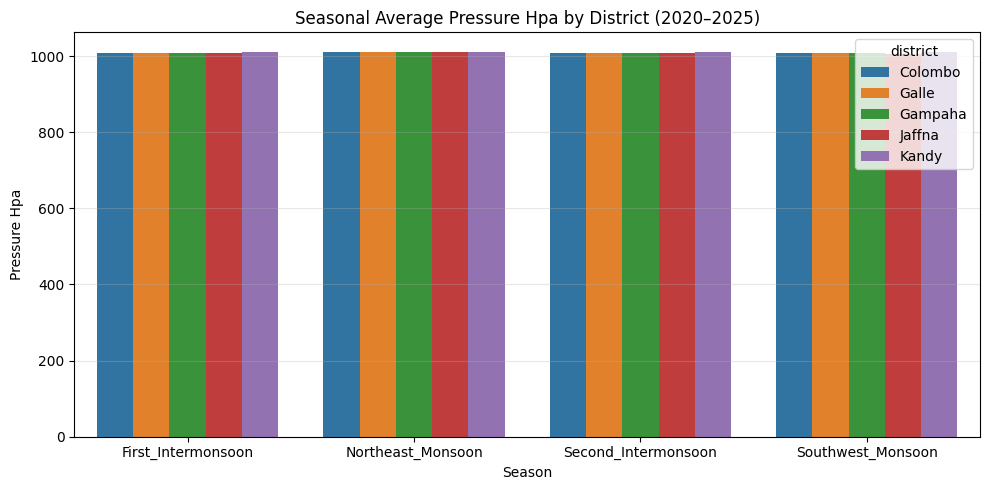

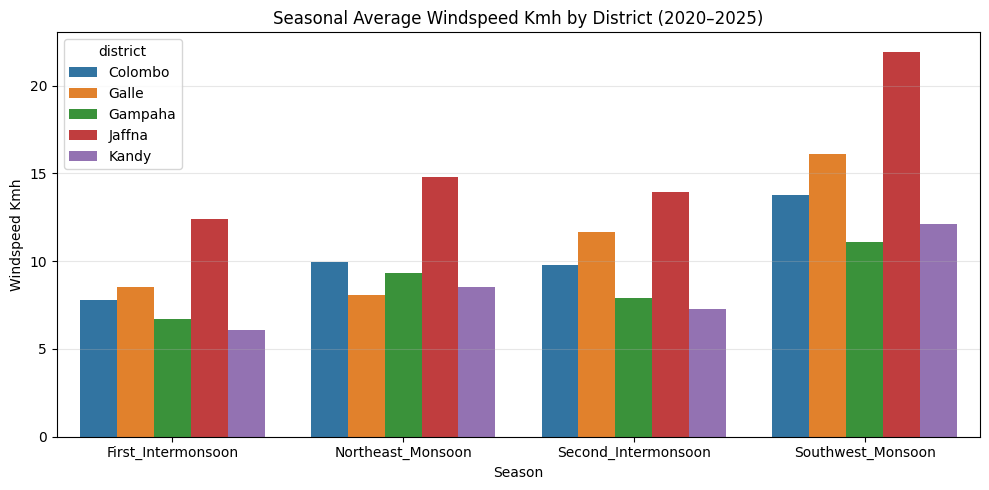

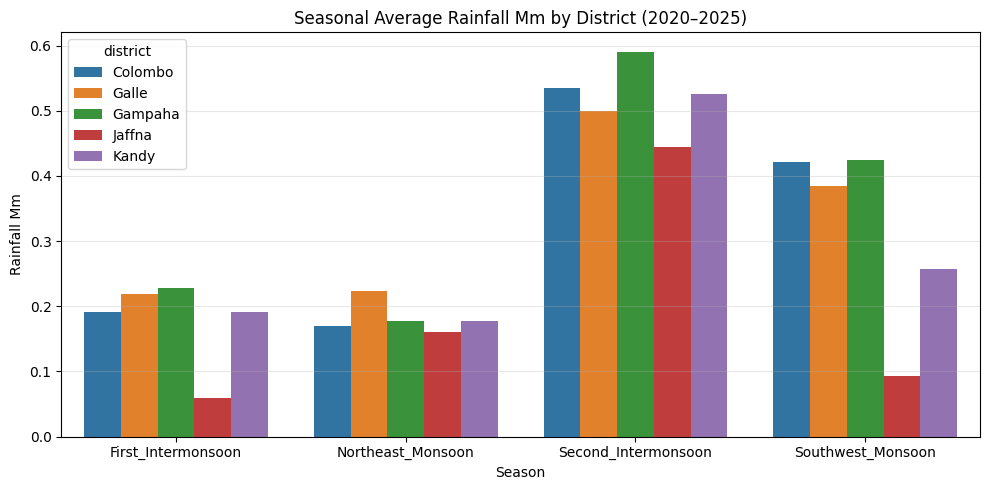

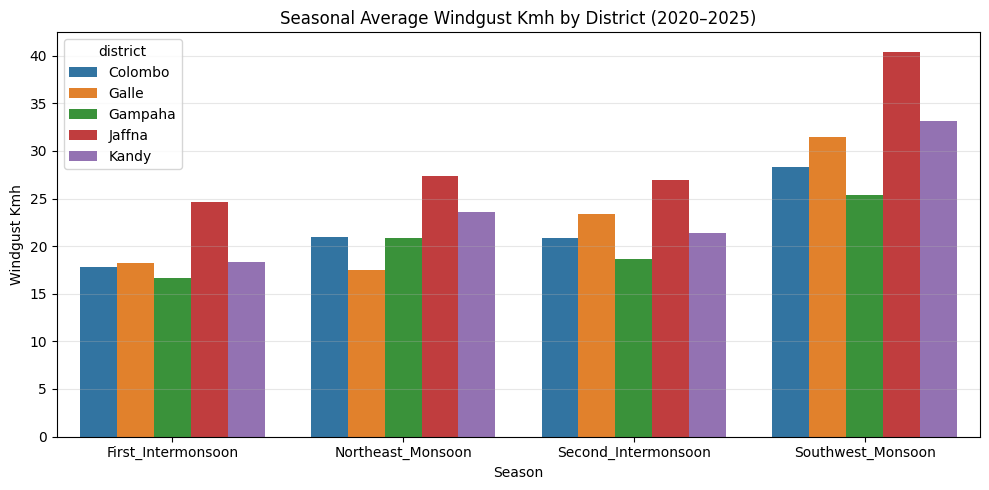

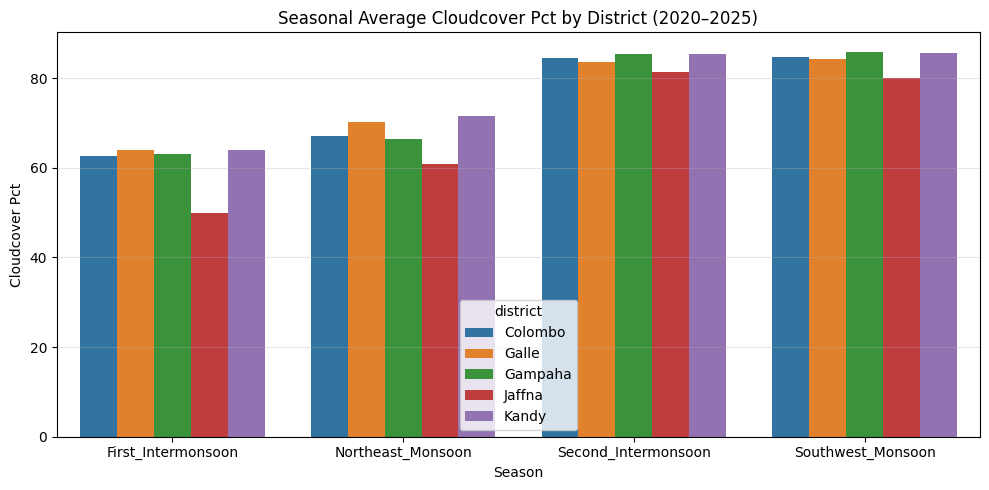

In [ ]:
# ================================================================
# SEASONAL ANALYSIS — MAJOR WEATHER VARIABLES
# ================================================================

seasonal_variables = [
    "temperature_c",
    "humidity_pct",
    "pressure_hpa",
    "windspeed_kmh",
    "rainfall_mm",
    "windgust_kmh",
    "cloudcover_pct"
]

for variable in seasonal_variables:

    if variable not in weather_df.columns:
        continue

    seasonal_data = (
        weather_df
        .groupby(["district", "season"])[variable]
        .mean()
        .reset_index()
    )

    plt.figure(figsize=(10,5))

    sns.barplot(
        data=seasonal_data,
        x="season",
        y=variable,
        hue="district"
    )

    plt.title(
        f"Seasonal Average {variable.replace('_', ' ').title()} "
        f"by District (2020–2025)"
    )

    plt.xlabel("Season")
    plt.ylabel(variable.replace("_", " ").title())

    plt.grid(
        axis="y",
        alpha=0.3
    )

    plt.tight_layout()
    plt.show()

Monthly analysis

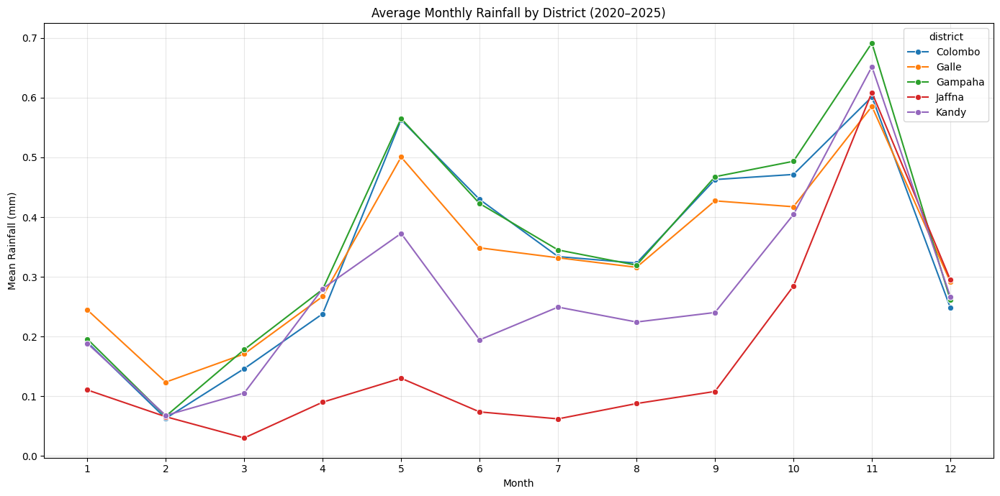

In [ ]:
# ================================================================
# MONTHLY RAINFALL ANALYSIS
# ================================================================

monthly_rainfall = (
    weather_df
    .groupby(["district", "month"])["rainfall_mm"]
    .mean()
    .reset_index()
)

plt.figure(figsize=(14, 7))

sns.lineplot(
    data=monthly_rainfall,
    x="month",
    y="rainfall_mm",
    hue="district",
    marker="o"
)

plt.title(
    "Average Monthly Rainfall by District (2020–2025)"
)

plt.xlabel("Month")
plt.ylabel("Mean Rainfall (mm)")

plt.xticks(range(1, 13))

plt.grid(alpha=0.3)

plt.tight_layout()
plt.show()

Monthly analysis of other major variables

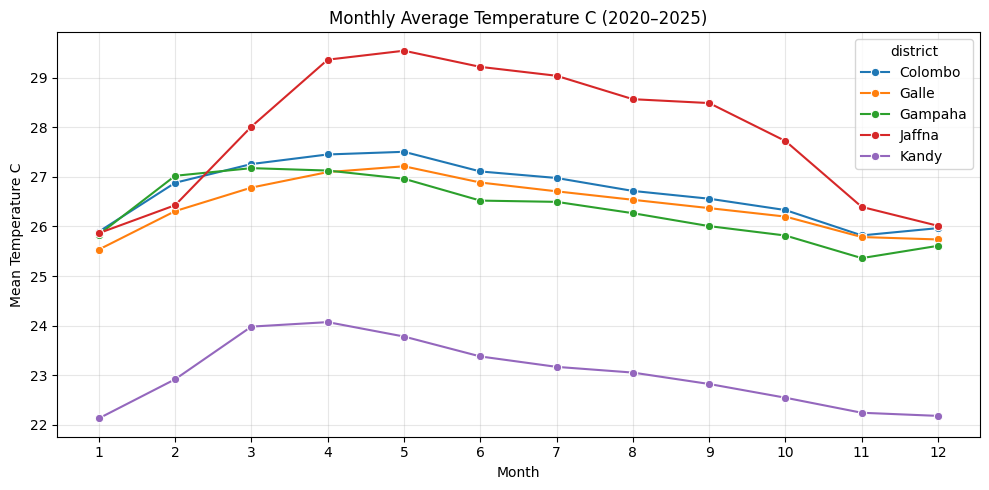

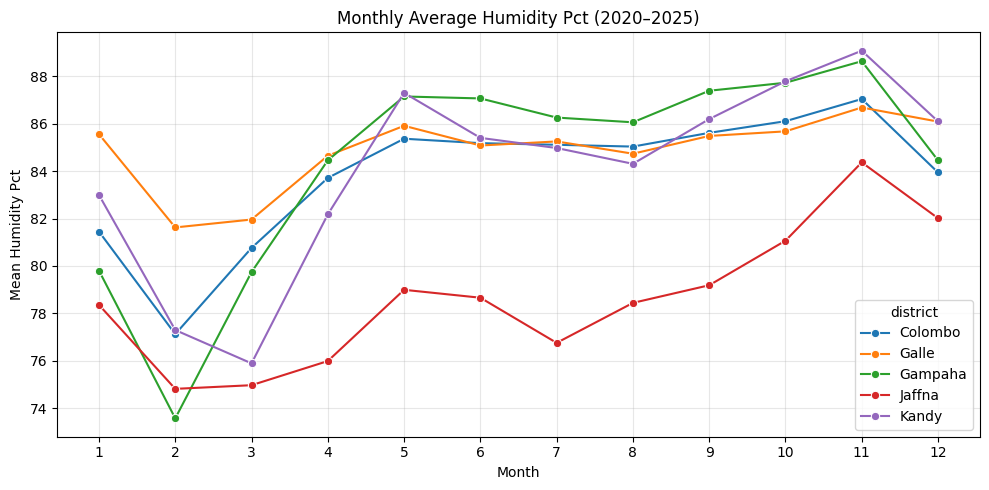

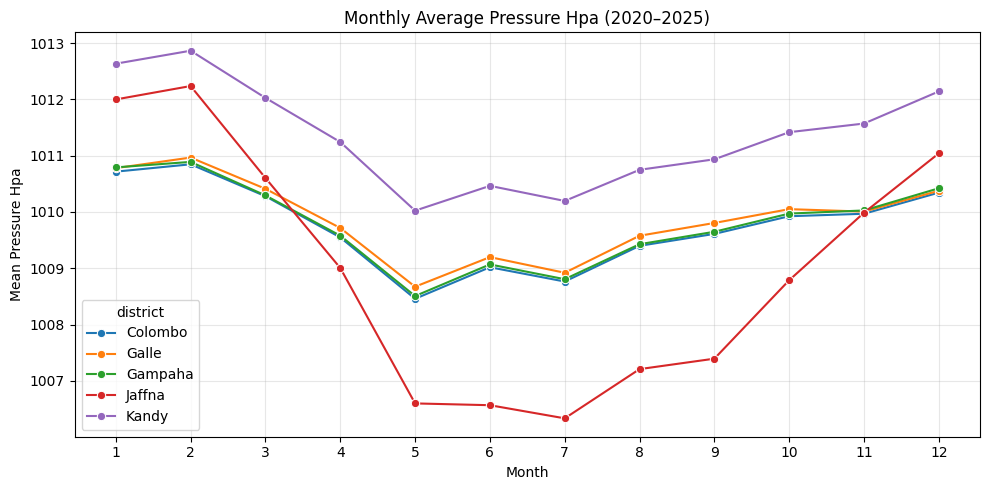

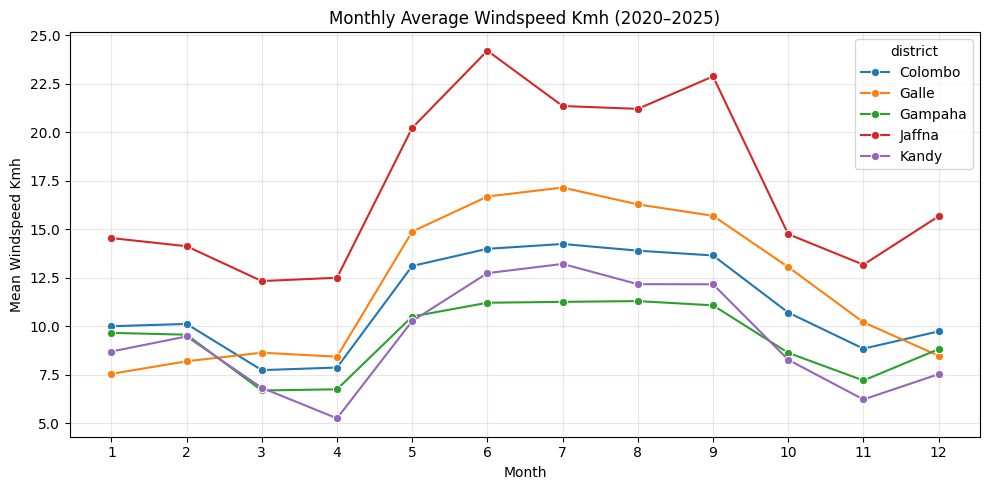

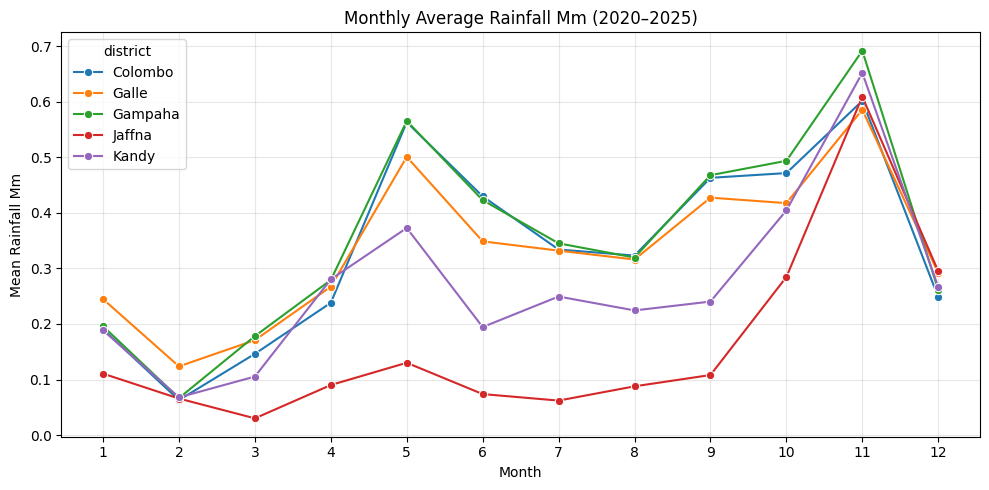

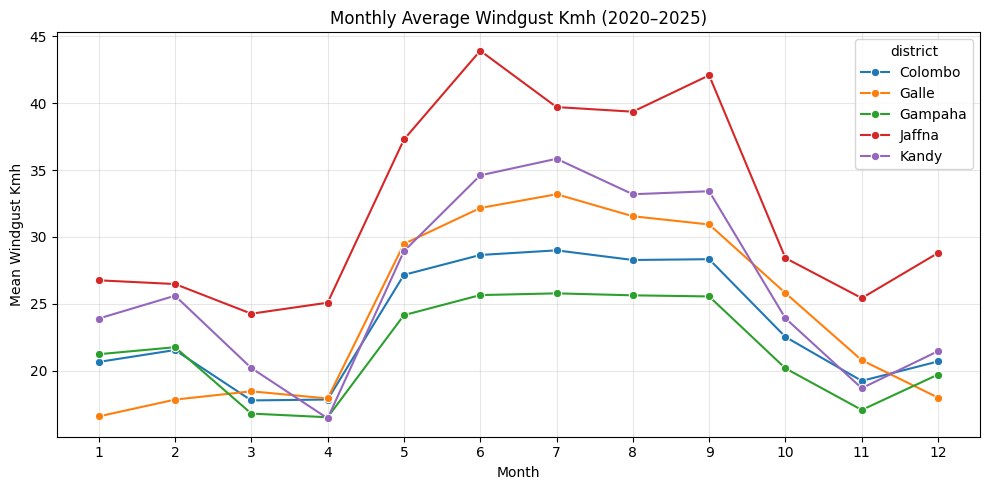

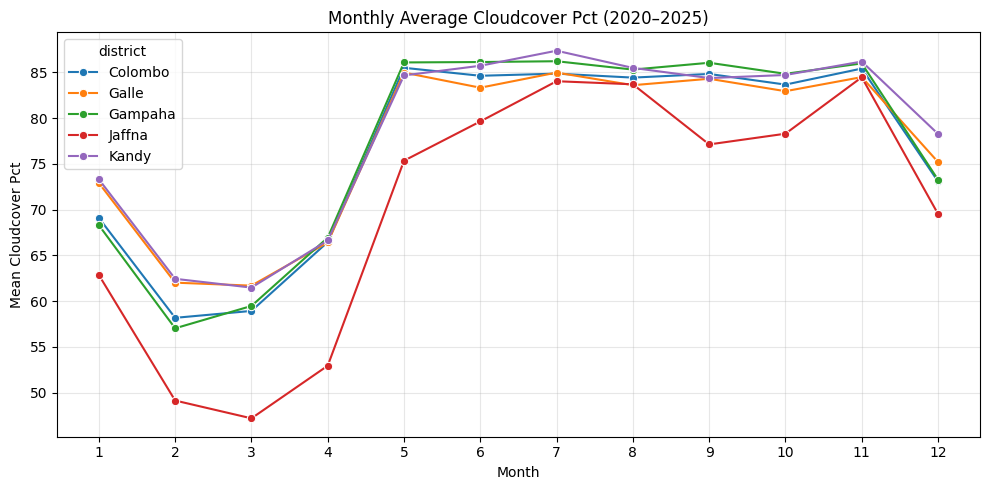

In [ ]:
# ================================================================
# MONTHLY ANALYSIS OF MAJOR WEATHER VARIABLES
# ================================================================

monthly_variables = [
    "temperature_c",
    "humidity_pct",
    "pressure_hpa",
    "windspeed_kmh",
    "rainfall_mm",
    "windgust_kmh",
    "cloudcover_pct"
]

for variable in monthly_variables:

    # Check whether variable exists
    if variable not in weather_df.columns:
        continue

    # Calculate monthly average for each district
    monthly_data = (
        weather_df
        .groupby(["district", "month"])[variable]
        .mean()
        .reset_index()
    )

    # Create plot
    plt.figure(figsize=(10, 5))

    sns.lineplot(
        data=monthly_data,
        x="month",
        y=variable,
        hue="district",
        marker="o"
    )

    # Title
    plt.title(
        f"Monthly Average {variable.replace('_', ' ').title()} (2020–2025)"
    )

    # Axis labels
    plt.xlabel("Month")
    plt.ylabel(
        f"Mean {variable.replace('_', ' ').title()}"
    )

    # Show all 12 months
    plt.xticks(range(1, 13))

    # Grid
    plt.grid(alpha=0.3)

    plt.tight_layout()
    plt.show()

Six-year monthly time-series trend

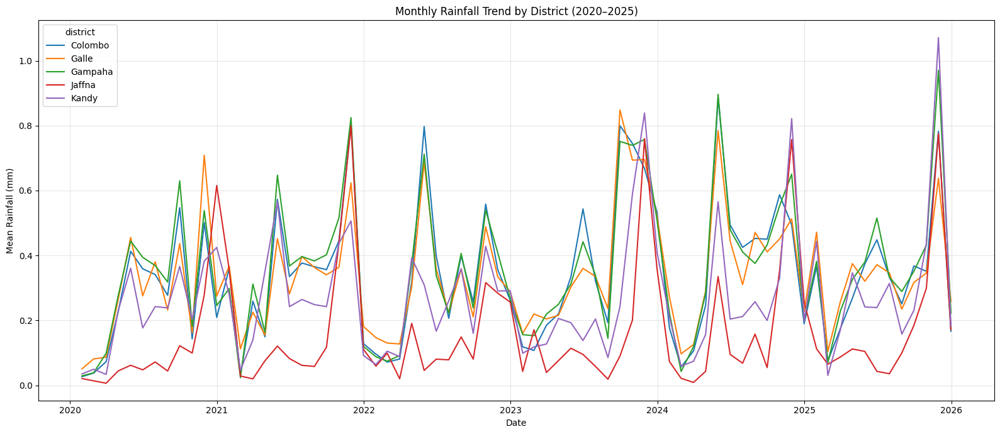

In [ ]:
# ================================================================
# MONTHLY TIME-SERIES TREND — ALL DISTRICTS
# ================================================================

monthly_ts = (
    weather_df
    .set_index("datetime")
    .groupby("district")["rainfall_mm"]
    .resample("ME")
    .mean()
    .reset_index()
)

plt.figure(figsize=(16, 7))

sns.lineplot(
    data=monthly_ts,
    x="datetime",
    y="rainfall_mm",
    hue="district"
)

plt.title(
    "Monthly Rainfall Trend by District (2020–2025)"
)

plt.xlabel("Date")
plt.ylabel("Mean Rainfall (mm)")

plt.grid(alpha=0.3)

plt.tight_layout()
plt.show()

Individual time-series plot for each district ( "temperature_c",
    "humidity_pct",
    "pressure_hpa",
    "windspeed_kmh",
    "rainfall_mm",
    "cloudcover_pct",
    "solarradiation_wm2",
    "windgust_kmh",  
    

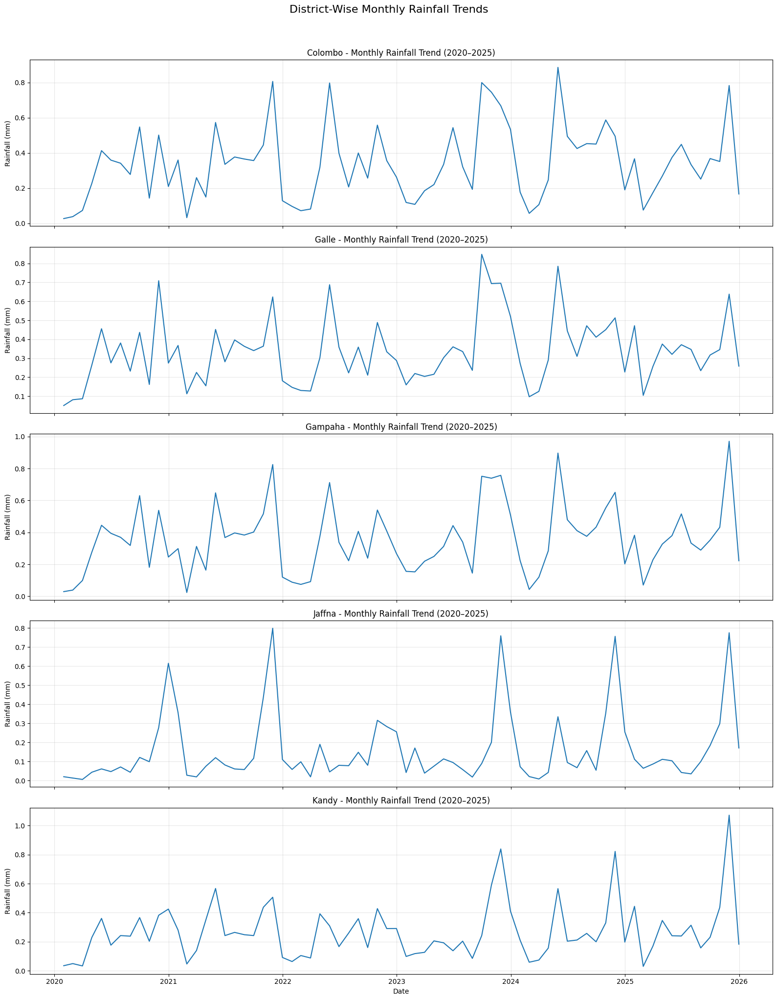

In [ ]:
# ================================================================
# TIME-SERIES TREND — INDIVIDUAL DISTRICTS
# ================================================================

fig, axes = plt.subplots(
    nrows=len(districts),
    ncols=1,
    figsize=(16, 20),
    sharex=True
)

if len(districts) == 1:
    axes = [axes]

for ax, district in zip(axes, districts):

    district_data = monthly_ts[
        monthly_ts["district"] == district
    ]

    ax.plot(
        district_data["datetime"],
        district_data["rainfall_mm"]
    )

    ax.set_title(
        f"{district} - Monthly Rainfall Trend (2020–2025)"
    )

    ax.set_ylabel("Rainfall (mm)")

    ax.grid(alpha=0.3)

axes[-1].set_xlabel("Date")

plt.suptitle(
    "District-Wise Monthly Rainfall Trends",
    fontsize=16,
    y=1.02
)

plt.tight_layout()
plt.show()

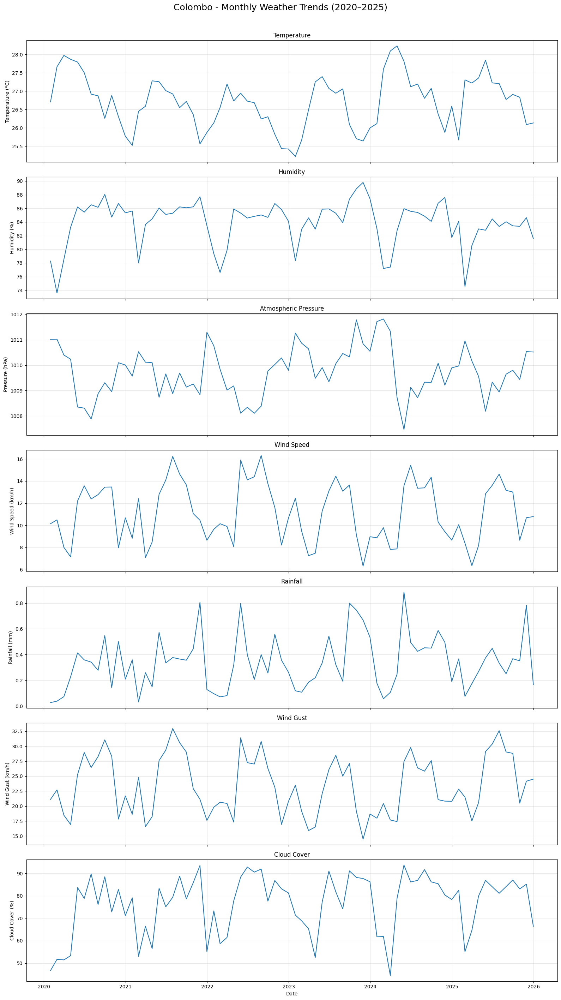

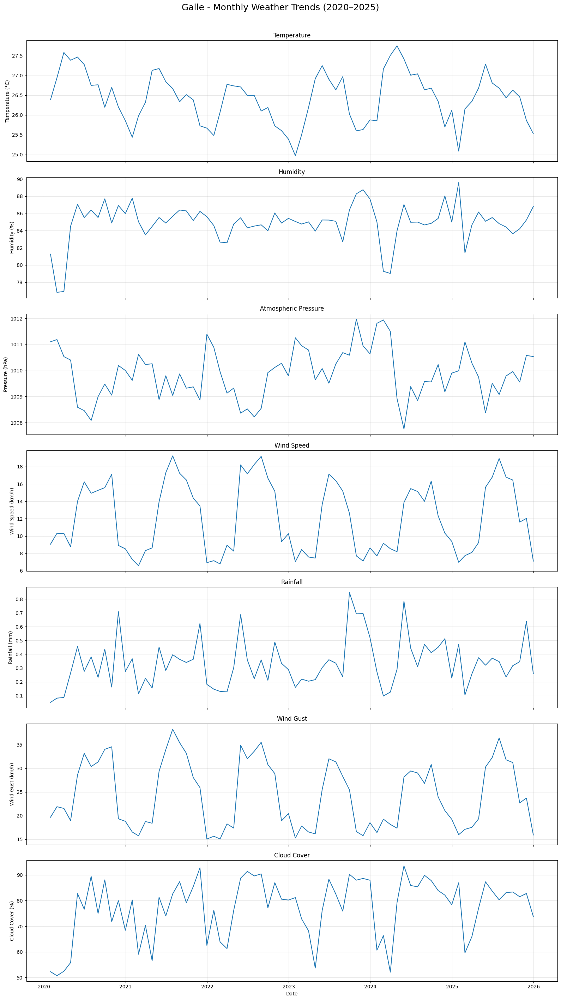

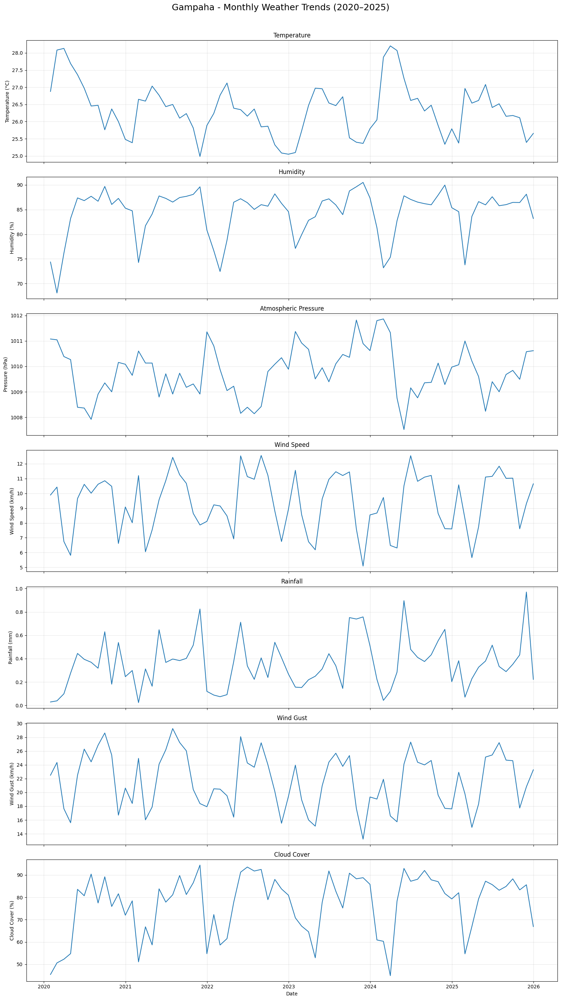

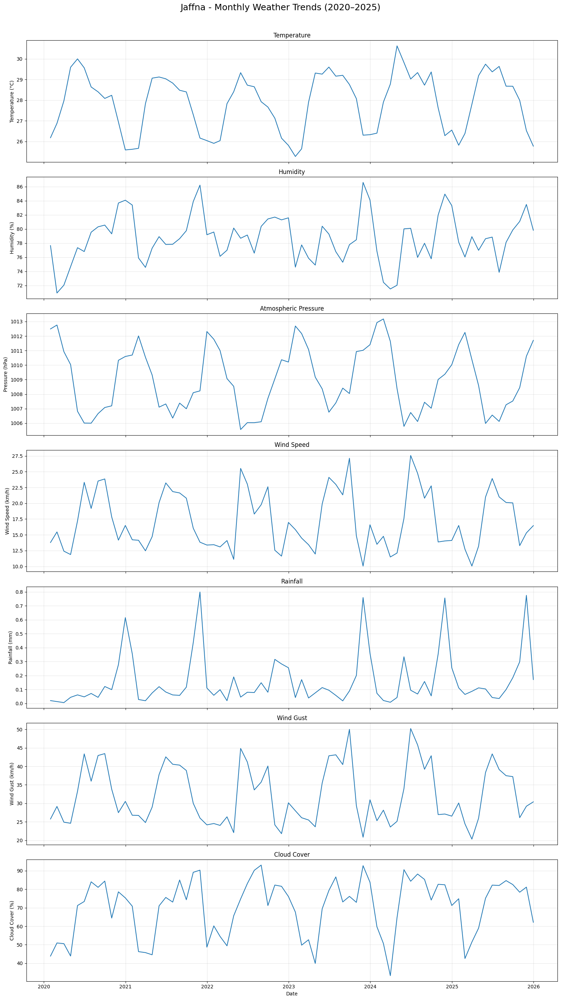

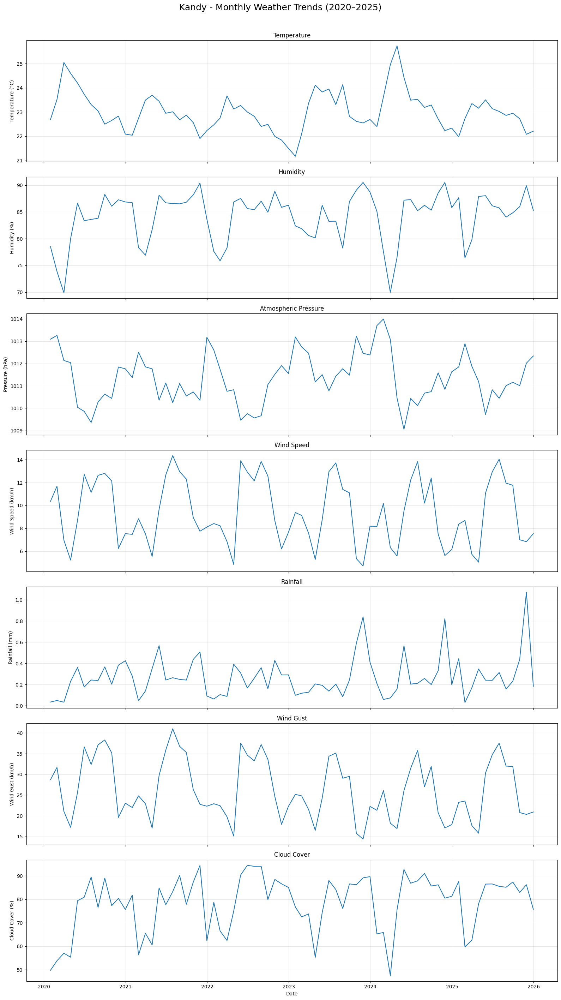

In [ ]:
# ================================================================
# MONTHLY TIME-SERIES TRENDS — DISTRICT-WISE
# ALL MAJOR WEATHER VARIABLES IN ONE FIGURE PER DISTRICT
# ================================================================

monthly_variables = [
    "temperature_c",
    "humidity_pct",
    "pressure_hpa",
    "windspeed_kmh",
    "rainfall_mm",
    "windgust_kmh",
    "cloudcover_pct"
]

# Variable names and Y-axis labels
variable_labels = {
    "temperature_c": (
        "Temperature",
        "Temperature (°C)"
    ),
    "humidity_pct": (
        "Humidity",
        "Humidity (%)"
    ),
    "pressure_hpa": (
        "Atmospheric Pressure",
        "Pressure (hPa)"
    ),
    "windspeed_kmh": (
        "Wind Speed",
        "Wind Speed (km/h)"
    ),
    "rainfall_mm": (
        "Rainfall",
        "Rainfall (mm)"
    ),
    "windgust_kmh": (
        "Wind Gust",
        "Wind Gust (km/h)"
    ),
    "cloudcover_pct": (
        "Cloud Cover",
        "Cloud Cover (%)"
    )
}

# Get districts
districts = sorted(
    weather_df["district"].dropna().unique()
)

# ================================================================
# LOOP THROUGH EACH DISTRICT
# ================================================================

for district in districts:

    # ------------------------------------------------------------
    # Filter data for the current district
    # ------------------------------------------------------------

    district_df = weather_df[
        weather_df["district"] == district
    ].copy()

    # ------------------------------------------------------------
    # Create figure with 7 subplots
    # ------------------------------------------------------------

    fig, axes = plt.subplots(
        nrows=len(monthly_variables),
        ncols=1,
        figsize=(16, 28),
        sharex=True
    )

    # Make sure axes is iterable
    if len(monthly_variables) == 1:
        axes = [axes]


    for ax, variable in zip(axes, monthly_variables):

        # Check variable exists
        if variable not in district_df.columns:
            continue

        monthly_data = (
            district_df
            .set_index("datetime")[variable]
            .resample("ME")
            .mean()
            .reset_index()
        )

        variable_name, y_label = variable_labels[variable]

        ax.plot(
            monthly_data["datetime"],
            monthly_data[variable],
            linewidth=1.5
        )

        ax.set_title(
            variable_name,
            fontsize=12
        )

        ax.set_ylabel(
            y_label
        )

        ax.grid(
            alpha=0.3
        )

    axes[-1].set_xlabel(
        "Date"
    )

    plt.suptitle(
        f"{district} - Monthly Weather Trends (2020–2025)",
        fontsize=18,
        y=1.01
    )

    plt.tight_layout()

    plt.show()

Year × district heatmap

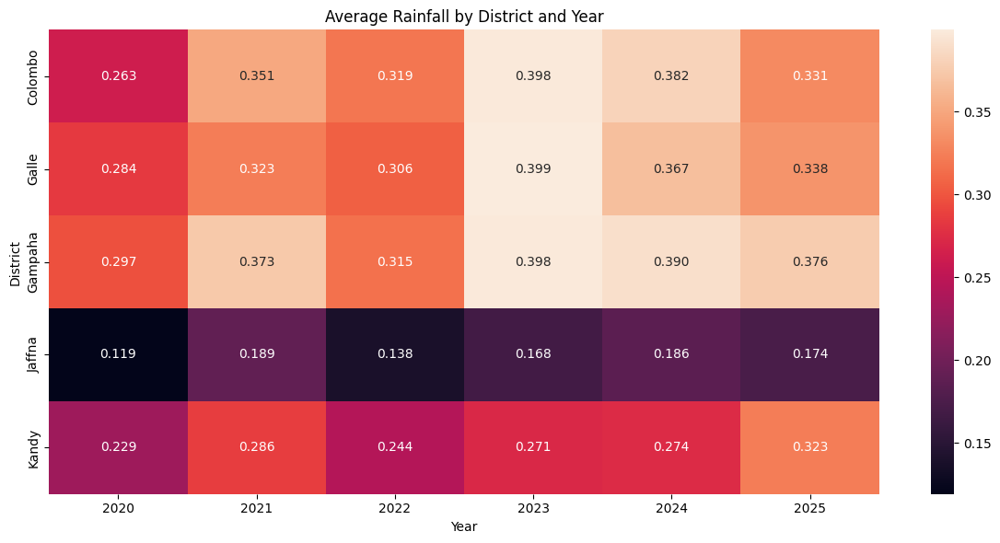

In [ ]:
# ================================================================
# YEAR × DISTRICT RAINFALL HEATMAP
# ================================================================

year_district_rainfall = (
    weather_df
    .groupby(["district", "year"])["rainfall_mm"]
    .mean()
    .unstack()
)

plt.figure(figsize=(12, 6))

sns.heatmap(
    year_district_rainfall,
    annot=True,
    fmt=".3f"
)

plt.title(
    "Average Rainfall by District and Year"
)

plt.xlabel("Year")
plt.ylabel("District")

plt.tight_layout()
plt.show()

Season × district heatmap

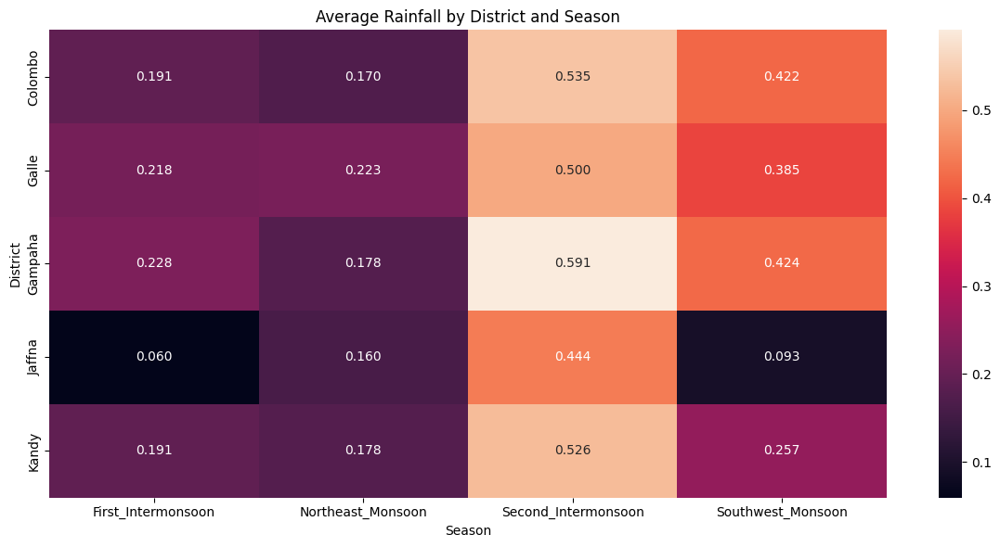

In [ ]:
# ================================================================
# SEASON × DISTRICT RAINFALL HEATMAP
# ================================================================

season_district_rainfall = (
    weather_df
    .groupby(["district", "season"])["rainfall_mm"]
    .mean()
    .unstack()
)

plt.figure(figsize=(12, 6))

sns.heatmap(
    season_district_rainfall,
    annot=True,
    fmt=".3f"
)

plt.title(
    "Average Rainfall by District and Season"
)

plt.xlabel("Season")
plt.ylabel("District")

plt.tight_layout()
plt.show()

District-wise temperature trend

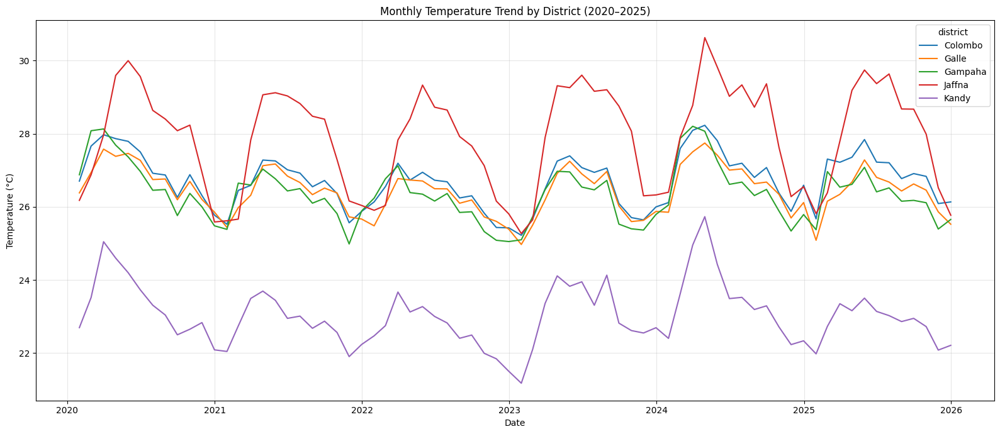

In [ ]:
# ================================================================
# TEMPERATURE TIME-SERIES TREND
# ================================================================

monthly_temperature = (
    weather_df
    .set_index("datetime")
    .groupby("district")["temperature_c"]
    .resample("ME")
    .mean()
    .reset_index()
)

plt.figure(figsize=(16, 7))

sns.lineplot(
    data=monthly_temperature,
    x="datetime",
    y="temperature_c",
    hue="district"
)

plt.title(
    "Monthly Temperature Trend by District (2020–2025)"
)

plt.xlabel("Date")
plt.ylabel("Temperature (°C)")

plt.grid(alpha=0.3)

plt.tight_layout()
plt.show()

other variables

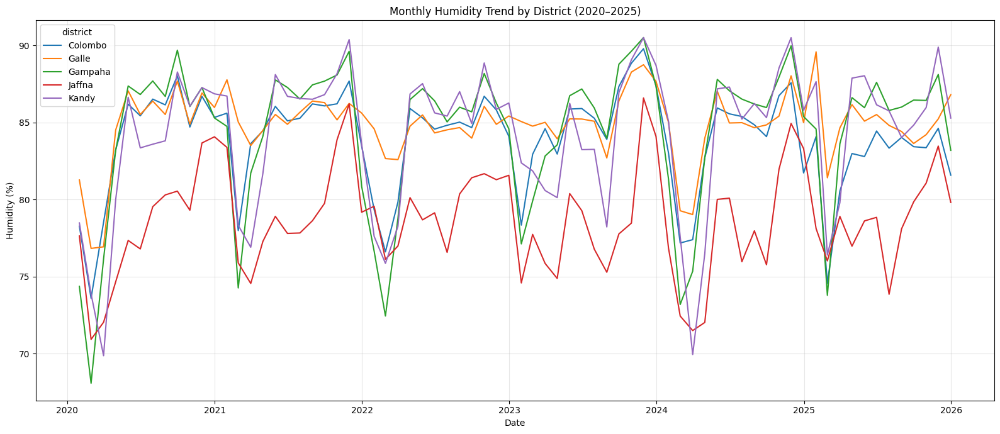

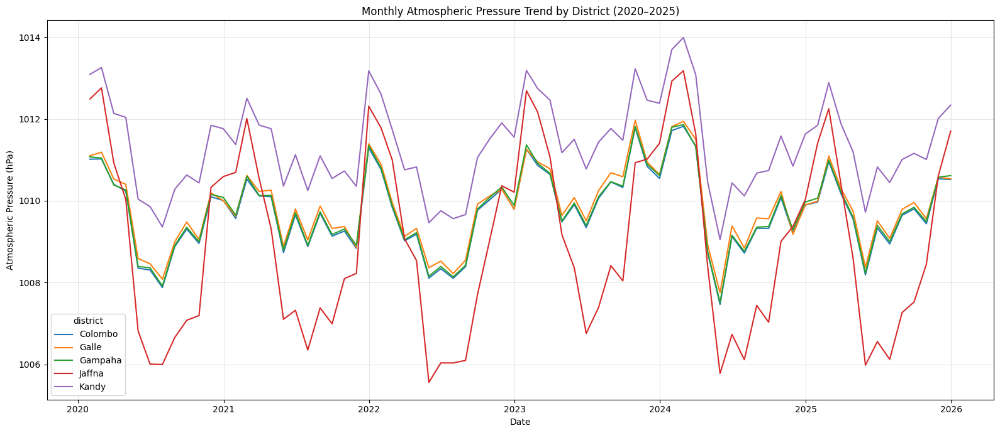

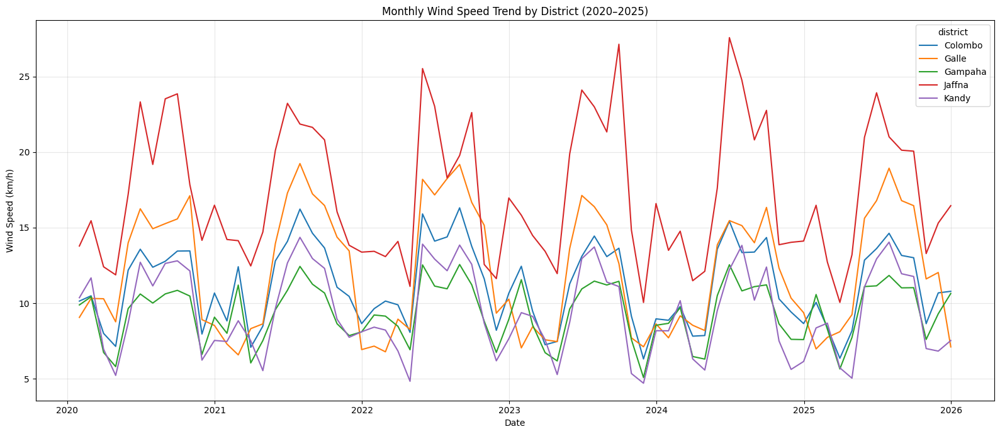

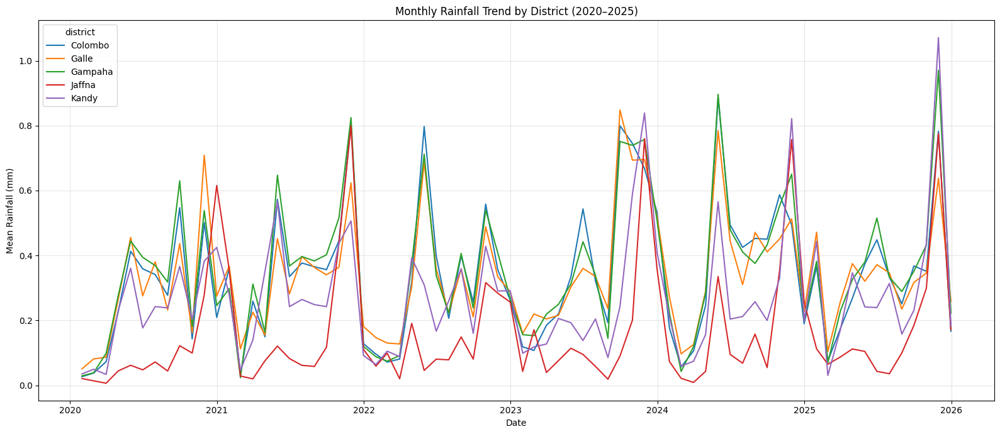

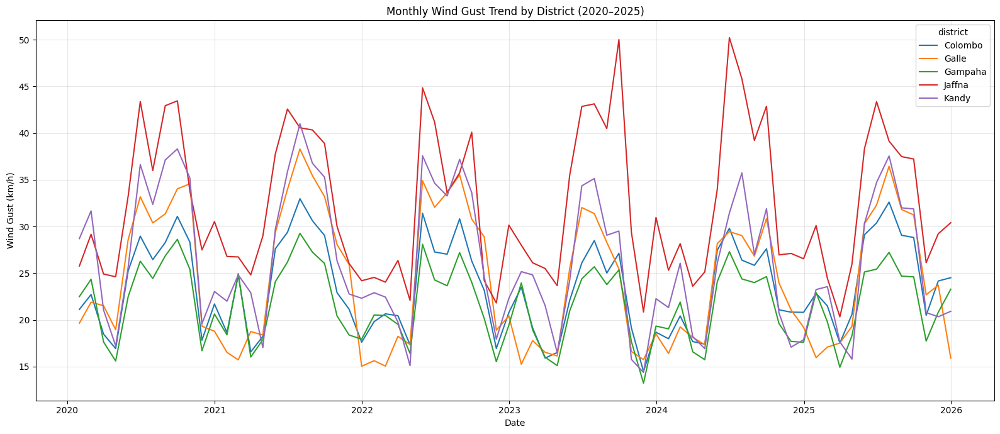

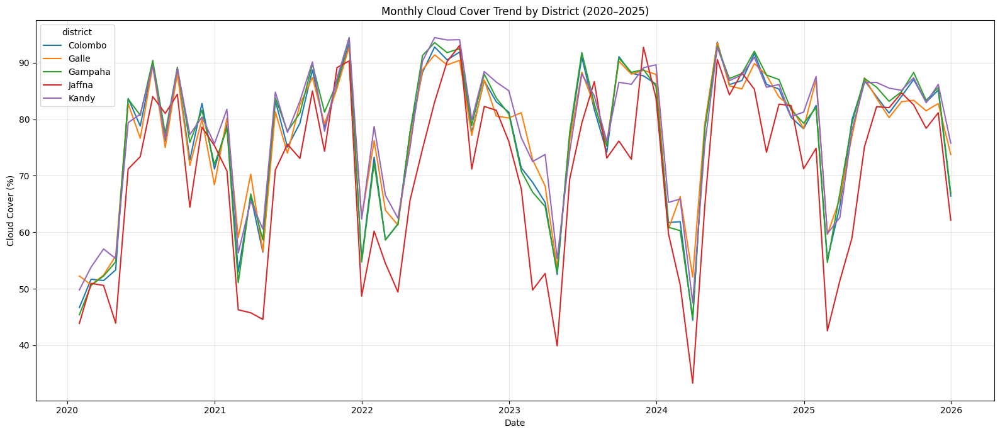

In [ ]:
# ================================================================
# MONTHLY TIME-SERIES TREND — MAJOR WEATHER VARIABLES
# ================================================================

monthly_variables = [
    "humidity_pct",
    "pressure_hpa",
    "windspeed_kmh",
    "rainfall_mm",
    "windgust_kmh",
    "cloudcover_pct"
]

# Display names and units for each variable
variable_labels = {
    "temperature_c": ("Temperature", "Temperature (°C)"),
    "humidity_pct": ("Humidity", "Humidity (%)"),
    "pressure_hpa": ("Atmospheric Pressure", "Atmospheric Pressure (hPa)"),
    "windspeed_kmh": ("Wind Speed", "Wind Speed (km/h)"),
    "rainfall_mm": ("Rainfall", "Mean Rainfall (mm)"),
    "windgust_kmh": ("Wind Gust", "Wind Gust (km/h)"),
    "cloudcover_pct": ("Cloud Cover", "Cloud Cover (%)")
}


# CREATE A TIME-SERIES PLOT FOR EACH VARIABLE

for variable in monthly_variables:


    # Calculate monthly mean for each district
    monthly_data = (
        weather_df
        .set_index("datetime")
        .groupby("district")[variable]
        .resample("ME")
        .mean()
        .reset_index()
    )
    variable_name, y_label = variable_labels[variable]
    plt.figure(figsize=(16, 7))

    sns.lineplot(
        data=monthly_data,
        x="datetime",
        y=variable,
        hue="district"
    )
    plt.title(
        f"Monthly {variable_name} Trend by District (2020–2025)"
    )
    plt.xlabel("Date")
    plt.ylabel(y_label)
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()

Correlation analysis

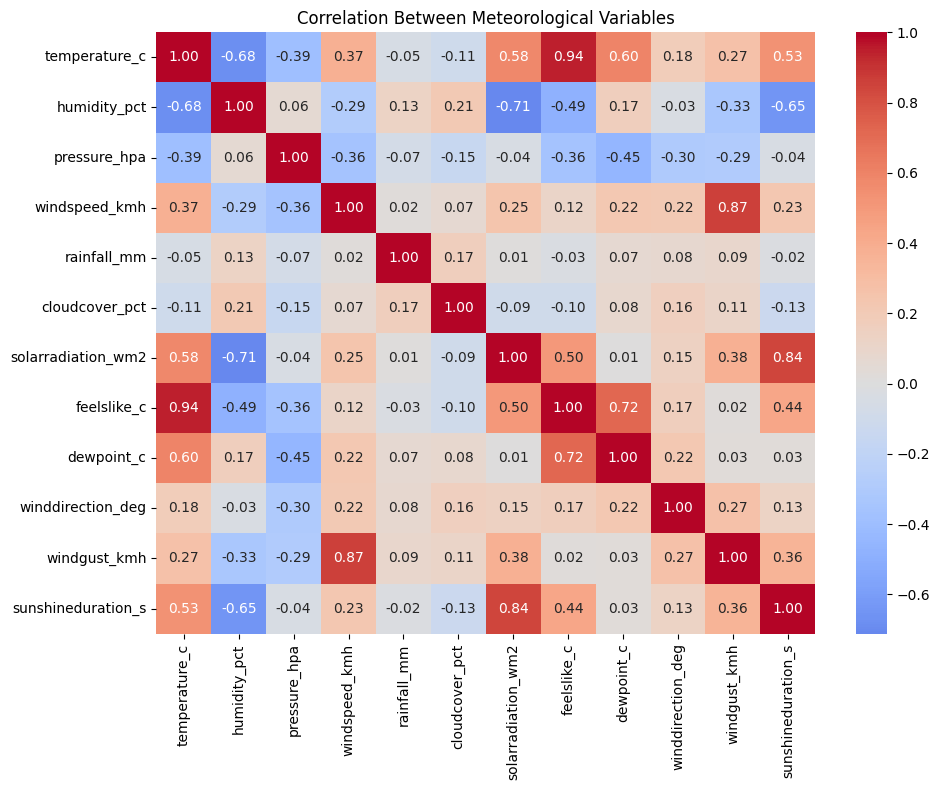

In [ ]:
# ================================================================
# CORRELATION ANALYSIS
# ================================================================

correlation_variables = [
    "temperature_c",
    "humidity_pct",
    "pressure_hpa",
    "windspeed_kmh",
    "rainfall_mm",
    "cloudcover_pct",
    "solarradiation_wm2",
    "feelslike_c",
    "dewpoint_c",
    "winddirection_deg",
    #"winddirection_compass",
    "windgust_kmh",
    "sunshineduration_s"
]

correlation_variables = [
    col for col in correlation_variables
    if col in weather_df.columns
]

correlation_matrix = (
    weather_df[correlation_variables]
    .corr()
)

plt.figure(figsize=(10, 8))

sns.heatmap(
    correlation_matrix,
    annot=True,
    fmt=".2f",
    cmap="coolwarm",
    center=0
)

plt.title(
    "Correlation Between Meteorological Variables"
)

plt.tight_layout()
plt.show()

analyze spatial variability

In [ ]:
# ================================================================
# POINT-LEVEL RAINFALL AVERAGE
# ================================================================

point_rainfall = (
    weather_df
    .groupby(
        ["district", "pointid", "latitude", "longitude"]
    )["rainfall_mm"]
    .mean()
    .reset_index()
)

display(
    point_rainfall.round(3)
)

,district,pointid,latitude,longitude,rainfall_mm
0,Colombo,1,6.860,79.794,0.338
1,Colombo,2,6.860,79.861,0.347
2,Colombo,3,6.860,79.929,0.347
3,Colombo,4,6.927,79.726,0.322
4,Colombo,5,6.927,79.794,0.338
...,...,...,...,...,...
102,Kandy,29,7.451,80.537,0.328
103,Kandy,30,7.451,80.601,0.352
104,Kandy,31,7.451,80.666,0.352
105,Kandy,32,7.451,80.730,0.342


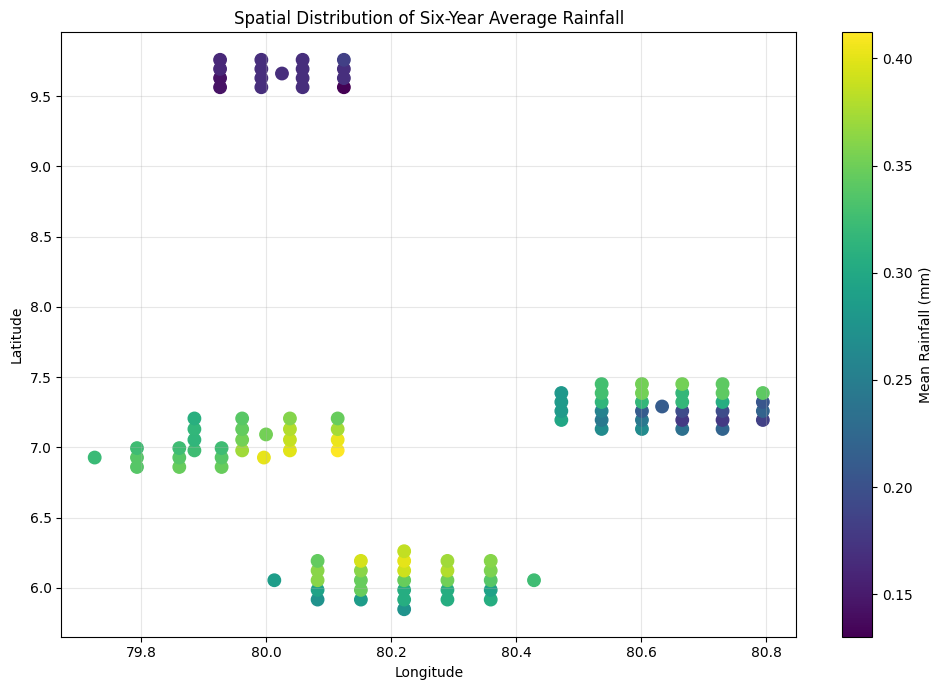

In [ ]:
# ================================================================
# SPATIAL DISTRIBUTION OF AVERAGE RAINFALL
# ================================================================

plt.figure(figsize=(10, 7))

scatter = plt.scatter(
    point_rainfall["longitude"],
    point_rainfall["latitude"],
    c=point_rainfall["rainfall_mm"],
    s=80
)

plt.colorbar(
    scatter,
    label="Mean Rainfall (mm)"
)

plt.xlabel("Longitude")
plt.ylabel("Latitude")

plt.title(
    "Spatial Distribution of Six-Year Average Rainfall"
)

plt.grid(alpha=0.3)

plt.tight_layout()
plt.show()

Linear Relashionship Analysis

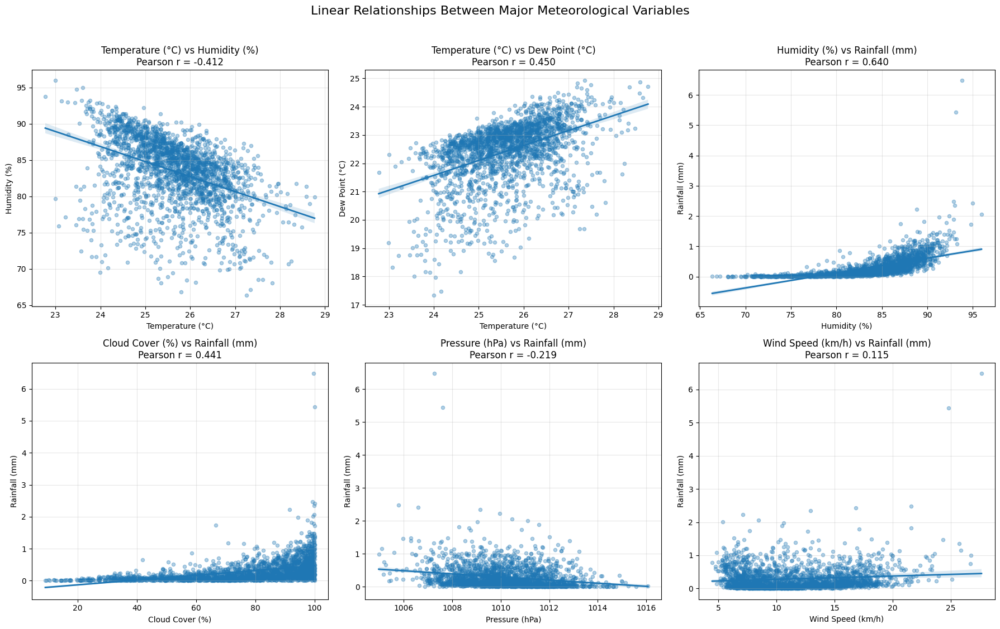

In [ ]:
# ================================================================
# LINEAR RELATIONSHIP ANALYSIS
# DAILY WEATHER DATA WITH REGRESSION LINES
# ================================================================

relationship_pairs = [
    ("temperature_c", "humidity_pct"),
    ("temperature_c", "dewpoint_c"),
    ("humidity_pct", "rainfall_mm"),
    ("cloudcover_pct", "rainfall_mm"),
    ("pressure_hpa", "rainfall_mm"),
    ("windspeed_kmh", "rainfall_mm")
]

# CREATE DAILY AVERAGE DATA

daily_data = (
    weather_df
    .set_index("datetime")
    .resample("D")[
        [
            "temperature_c",
            "humidity_pct",
            "pressure_hpa",
            "windspeed_kmh",
            "rainfall_mm",
            "cloudcover_pct",
            "dewpoint_c"
        ]
    ]
    .mean()
    .reset_index()
)

variable_labels = {
    "temperature_c": "Temperature (°C)",
    "humidity_pct": "Humidity (%)",
    "pressure_hpa": "Pressure (hPa)",
    "windspeed_kmh": "Wind Speed (km/h)",
    "rainfall_mm": "Rainfall (mm)",
    "cloudcover_pct": "Cloud Cover (%)",
    "dewpoint_c": "Dew Point (°C)"
}

fig, axes = plt.subplots(
    nrows=2,
    ncols=3,
    figsize=(18, 11)
)

axes = axes.flatten()

for ax, (x_variable, y_variable) in zip(
    axes,
    relationship_pairs
):

    plot_data = daily_data[
        [x_variable, y_variable]
    ].dropna()

    correlation = plot_data[
        [x_variable, y_variable]
    ].corr().iloc[0, 1]


    sns.regplot(
        data=plot_data,
        x=x_variable,
        y=y_variable,
        ax=ax,
        scatter_kws={
            "alpha": 0.35,
            "s": 20
        },
        line_kws={
            "linewidth": 2
        }
    )

    ax.set_title(
        f"{variable_labels[x_variable]} vs "
        f"{variable_labels[y_variable]}\n"
        f"Pearson r = {correlation:.3f}"
    )

    ax.set_xlabel(
        variable_labels[x_variable]
    )

    ax.set_ylabel(
        variable_labels[y_variable]
    )

    ax.grid(
        alpha=0.3
    )

plt.suptitle(
    "Linear Relationships Between Major Meteorological Variables",
    fontsize=16,
    y=1.02
)

plt.tight_layout()
plt.show()

Rainfall Probability

In [ ]:
# ================================================================
# HOURLY RAINFALL PROBABILITY FOR EACH GEOGRAPHICAL POINT
# 2020–2025
# ================================================================

RAIN_THRESHOLD = 0.1  # mm

# Create rain occurrence indicator
weather_df["rain_occurs"] = (
    weather_df["rainfall_mm"] >= RAIN_THRESHOLD
).astype(int)

# Calculate rainfall probability
hourly_point_probability = (
    weather_df
    .groupby(
        [
            "district",
            "pointid",
            "latitude",
            "longitude",
            "hour"
        ]
    )["rain_occurs"]
    .mean()
    .mul(100)
    .reset_index(name="rain_probability_pct")
)

# Display results
print(
    "Shape:",
    hourly_point_probability.shape
)

display(
    hourly_point_probability.head(20)
)

Shape: (2568, 6)


,district,pointid,latitude,longitude,hour,rain_probability_pct
0,Colombo,1,6.85991,79.79351,0,40.282847
1,Colombo,1,6.85991,79.79351,1,42.244526
2,Colombo,1,6.85991,79.79351,2,43.795620
3,Colombo,1,6.85991,79.79351,3,45.437956
4,Colombo,1,6.85991,79.79351,4,45.985401
5,Colombo,1,6.85991,79.79351,5,45.392336
6,Colombo,1,6.85991,79.79351,6,39.187956
7,Colombo,1,6.85991,79.79351,7,41.240876
8,Colombo,1,6.85991,79.79351,8,45.346715
9,Colombo,1,6.85991,79.79351,9,51.277372


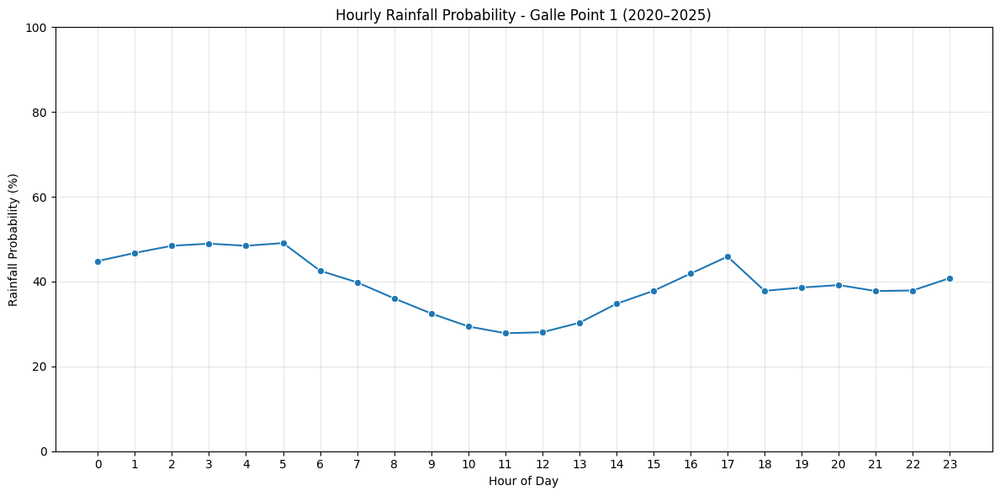

In [ ]:
# ================================================================
# RAINFALL PROBABILITY BY HOUR — SELECTED POINT
# ================================================================

SELECTED_DISTRICT = "Galle"
SELECTED_POINT = 1

point_data = hourly_point_probability[
    (hourly_point_probability["district"] == SELECTED_DISTRICT) &
    (hourly_point_probability["pointid"] == SELECTED_POINT)
]

plt.figure(figsize=(12, 6))

sns.lineplot(
    data=point_data,
    x="hour",
    y="rain_probability_pct",
    marker="o"
)

plt.title(
    f"Hourly Rainfall Probability - "
    f"{SELECTED_DISTRICT} Point {SELECTED_POINT} "
    f"(2020–2025)"
)

plt.xlabel("Hour of Day")
plt.ylabel("Rainfall Probability (%)")

plt.xticks(range(24))

plt.ylim(0, 100)

plt.grid(alpha=0.3)

plt.tight_layout()
plt.show()

Rainfall probability by district

In [ ]:
# ================================================================
# RAINFALL PROBABILITY BY DISTRICT
# ================================================================

district_rain_probability = (
    weather_df
    .assign(
        rain_occurs=(
            weather_df["rainfall_mm"] >= RAIN_THRESHOLD
        )
    )
    .groupby("district")["rain_occurs"]
    .mean()
    .mul(100)
    .reset_index(name="rain_probability_pct")
)

print(district_rain_probability)

  district  rain_probability_pct
0  Colombo             47.167040
1    Galle             48.560072
2  Gampaha             46.815067
3   Jaffna             23.322443
4    Kandy             37.578914


Rainfall probability by hour

In [ ]:
# ================================================================
# HOURLY RAINFALL PROBABILITY
# ================================================================

hourly_rain_probability = (
    weather_df
    .assign(
        rain_occurs=(
            weather_df["rainfall_mm"] >= RAIN_THRESHOLD
        )
    )
    .groupby("hour")["rain_occurs"]
    .mean()
    .mul(100)
    .reset_index(name="rain_probability_pct")
)

print(hourly_rain_probability)

    hour  rain_probability_pct
0      0             30.011000
1      1             31.691282
2      2             32.992104
3      3             33.706682
4      4             33.675131
5      5             33.041135
6      6             28.996691
7      7             30.690617
8      8             37.305154
9      9             45.401289
10    10             52.700986
11    11             57.800669
12    12             61.496777
13    13             64.245515
14    14             65.207807
15    15             63.327563
16    16             58.449587
17    17             50.412289
18    18             32.763575
19    19             28.733628
20    20             26.547684
21    21             25.532096
22    22             25.761478
23    23             27.345829


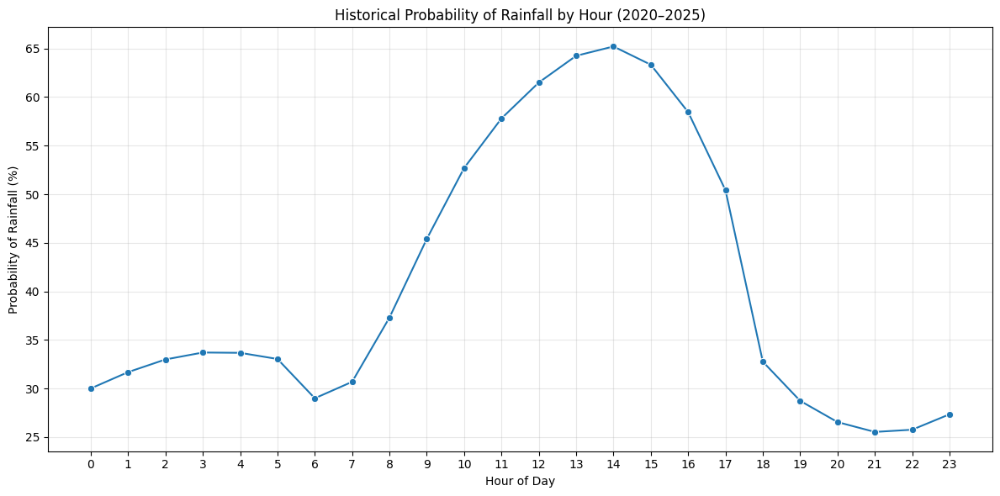

In [ ]:
plt.figure(figsize=(12, 6))

sns.lineplot(
    data=hourly_rain_probability,
    x="hour",
    y="rain_probability_pct",
    marker="o"
)

plt.title(
    "Historical Probability of Rainfall by Hour (2020–2025)"
)

plt.xlabel("Hour of Day")
plt.ylabel("Probability of Rainfall (%)")

plt.xticks(range(24))

plt.grid(alpha=0.3)

plt.tight_layout()
plt.show()

Rainfall probability by month

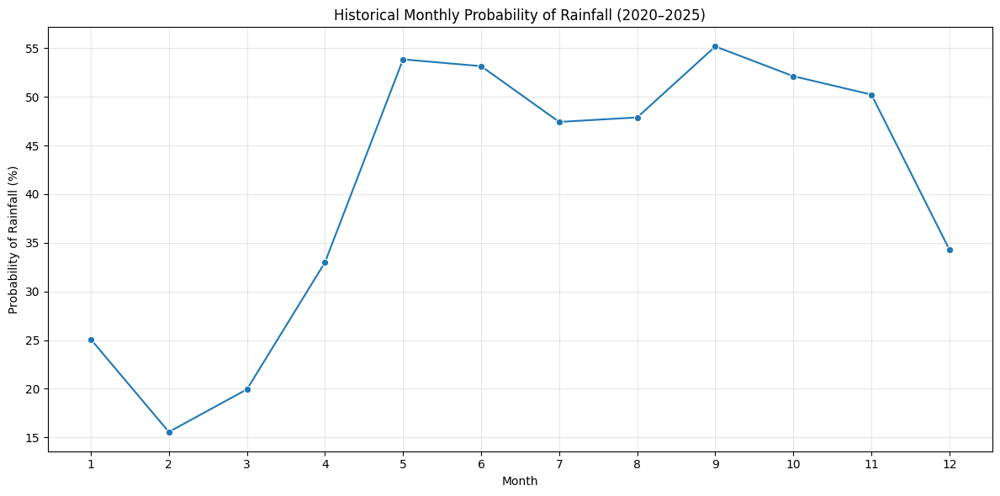

In [ ]:
# ================================================================
# MONTHLY RAINFALL PROBABILITY
# ================================================================

monthly_rain_probability = (
    weather_df
    .assign(
        rain_occurs=(
            weather_df["rainfall_mm"] >= RAIN_THRESHOLD
        )
    )
    .groupby("month")["rain_occurs"]
    .mean()
    .mul(100)
    .reset_index(name="rain_probability_pct")
)

plt.figure(figsize=(12, 6))

sns.lineplot(
    data=monthly_rain_probability,
    x="month",
    y="rain_probability_pct",
    marker="o"
)

plt.title(
    "Historical Monthly Probability of Rainfall (2020–2025)"
)

plt.xlabel("Month")
plt.ylabel("Probability of Rainfall (%)")

plt.xticks(range(1, 13))

plt.grid(alpha=0.3)

plt.tight_layout()
plt.show()

Making Colombo dataset

In [5]:
# Get only colombo records
colombo_df = weather_df[
    weather_df["district"].str.lower() == "colombo"
].copy()

print("colombo dataset shape:", colombo_df.shape)

# Check geographical points
print("Number of colombo points:", colombo_df["pointid"].nunique())

# Check date range
print("Date range:")
print(colombo_df["datetime"].min(), "to", colombo_df["datetime"].max())

# Save Galle dataset
colombo_path = "/content/drive/MyDrive/Capstone_Datasets/colombo_weather.parquet"

colombo_df.to_parquet(
    colombo_path,
    index=False
)

print("colombo dataset saved successfully!")

colombo dataset shape: (578688, 34)
Number of colombo points: 11
Date range:
2020-01-01 00:00:00 to 2025-12-31 23:00:00
colombo dataset saved successfully!


In [6]:
# Get unique geographical points
colombo_points = (
    colombo_df[
        [
            "district",
            "pointid",
            "latitude",
            "longitude",
            "elevation_m"
        ]
    ]
    .drop_duplicates(subset=["pointid"])
    .sort_values("pointid")
    .reset_index(drop=True)
)


print("Number of geographical points:", len(colombo_points))

print("\nColombo geographical points:")
display(colombo_points)

# SAVE AS CSV

colombo_points_path = (
    "/content/drive/MyDrive/Capstone_Datasets/"
    "colombo_geographical_points.csv"
)

colombo_points.to_csv(
    colombo_points_path,
    index=False
)


print("\nColombo geographical points saved successfully!")
print(colombo_points_path)

Number of geographical points: 11

Colombo geographical points:


,district,pointid,latitude,longitude,elevation_m
0,Colombo,1,6.85991,79.79351,0.0
1,Colombo,2,6.85991,79.86120,5.0
2,Colombo,3,6.85991,79.92889,19.0
3,Colombo,4,6.92710,79.72583,0.0
4,Colombo,5,6.92710,79.79351,0.0
5,Colombo,6,6.92710,79.86120,9.0
6,Colombo,7,6.92710,79.92889,24.0
7,Colombo,8,6.92710,79.99657,8.0
8,Colombo,9,6.99429,79.79351,0.0
9,Colombo,10,6.99429,79.86120,0.0



Colombo geographical points saved successfully!
/content/drive/MyDrive/Capstone_Datasets/colombo_geographical_points.csv
